# Heater Current Drift Detection
## Regression-based Approach
Author: Sandro Wiedmer

Q2/2026

## 1. Install & Imports

In [0]:
# %pip install xgboost --quiet


In [0]:
import pyspark.sql.functions as F
from pyspark.sql.window import Window
from pyspark.ml.feature import VectorAssembler, StringIndexer
from pyspark.ml import Pipeline

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression as SkLR
from sklearn.ensemble import RandomForestRegressor as SkRF
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score,
    confusion_matrix, ConfusionMatrixDisplay
)

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np


## 2. Configuration

In [0]:
# ── Damaged pairs ──────────────────────────────────────────────────────────────
DAMAGED_PAIRS = [
  ("t3-1678901-1966","1674634"),
  ("t3-1831151-186","1824362"),
  ("t3-1882150-500","1864990"),
  ("t3-1991730-874","1977123"),
  ("t3-2008-1726","1892070"),
  ("t3-2008-1726","2043143"),
  ("t3-2009-1777","1448576"),
  ("t3-2002-1557","1392867"),
  ("t3-1817879-52","1810944"),
  ("t3-1993491-843","1950888"),
  ("t3-1882151-611","1853962"),
  ("t3-1829086-180","1939694"),
  ("t3-1830503-165","1823505"),
  ]


DAMAGED_SET = set(DAMAGED_PAIRS)

# ── Feature sets ───────────────────────────────────────────────────────────────
FEATURES_4 = ["focal_spot", "hv_kv_set", "tucu_ma_set", "pwr_w_reached", "grid_voltage"]
FEATURES_2 = ["focal_spot", "hv_kv_set"]

# ── Balancing — train only; test is NEVER balanced ────────────────────────────
BALANCE_TRAIN = False  # if True,   # balance training set for equal pair weight during fitting
                       # test set always uses ALL samples to preserve time series

# ── Pair-specific baseline ─────────────────────────────────────────────────────
BASELINE_N = 30        # number of early-life residuals per pair used to define
                       # its individual baseline (median). Drift = deviation above this.

# ── CUSUM parameters ───────────────────────────────────────────────────────────
# CUSUM detects a persistent upward shift in baseline-adjusted residuals.
# k  = slack / allowance  (typically 0.5 × expected shift size in std-dev units)
# h  = decision threshold (typical range 4–6 std devs; lower = more sensitive)
CUSUM_K = 0.5          # allowance: ignore shifts smaller than k std devs
CUSUM_H = 4.0          # alarm threshold in std-dev units

# ── Operating-group z-score ────────────────────────────────────────────────────
# Residuals are z-scored within (focal_spot, kV_bucket) groups to remove
# regime-specific offsets before applying a single threshold.
KV_BUCKET_SIZE  = 50   # kV bin width for grouping (e.g. 50 → [0,50), [50,100), …)

# ── Rolling signed-residual threshold ─────────────────────────────────────────
ROLLING_WINDOW       = 20    # smoothing window for rolling mean of residuals
ROLLING_SIGNED_ZSCORE_THRESH = 2.5  # alarm when rolling signed z-score exceeds this

# ── Score fusion mode ──────────────────────────────────────────────────────────
# "OR"  → flag if ANY signal fires  (max recall, more FP)
# "AND" → flag if ALL signals fire  (max precision, fewer FP)
# "MAJORITY" → flag if ≥ 2 of 3 signals fire
FUSION_MODE = "OR"

# ── Threshold sweep (for Pareto analysis) ─────────────────────────────────────
CUSUM_H_SWEEP = [1.5, 2.0, 3.0, 4.0, 5.0, 6.0, 8.0, 10.0]
ROLLING_Z_SWEEP = [1.5, 2.0, 2.5, 3.0, 4.0, 5.0]

# ── Minimum consecutive alarms to confirm drift ───────────────────────────────
MIN_DETECTIONS = 3


## 2b. [EXPERIMENTAL] Configuration — Improvements
New parameters for the improved detection strategy.
All `EXP_` prefixed. Existing cells above are **unchanged**.


In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] Additional configuration — insert after §2 Configuration
# ══════════════════════════════════════════════════════════════════════════════

# ── Pair-specific baseline (IMPROVED) ─────────────────────────────────────────
# Use a robust OLS trend through the first N samples to anchor the baseline,
# rather than just a median. This removes the initial slope as well as the offset.
EXP_BASELINE_N        = 50       # early-life samples per pair for baseline fit
                                  # increase if tubes need more warm-up samples

# ── Positive-only CUSUM ───────────────────────────────────────────────────────
# Since drift is ALWAYS in the positive direction, we run a one-sided upper CUSUM
# on the baseline-detrended, group-normalised residual.
# The existing CUSUM already does this but we additionally reset it when the
# residual stays negative for CUSUM_RESET_N consecutive samples, which prevents
# false accumulation from heteroscedastic noise.
EXP_CUSUM_K           = 0.25     # smaller allowance → more sensitive to slow drift
EXP_CUSUM_H           = 1.0  #3.0      # lower alarm threshold → more sensitive
EXP_CUSUM_RESET_N     = 5        # reset S to 0 after this many consecutive negative samples

# ── Regime-specific CUSUM thresholds ─────────────────────────────────────────
# Each (focal_spot, kv_bucket) group gets its own σ-scaled k and h, so the
# threshold is tight where residuals are small and looser where they are large.
EXP_USE_REGIME_THRESH = True     # True → per-group k/h scaling; False → global

# ── Slope (linear trend) detector ────────────────────────────────────────────
# Fit a rolling OLS slope on resid_z_adj over a window; alarm if slope > threshold.
# Captures slow monotone drift that CUSUM might accumulate too slowly to catch.
EXP_SLOPE_WINDOW      = 30       # samples for rolling OLS slope
EXP_SLOPE_THRESH      = 0.03  #0.05     # alarm if slope (std-devs per sample) > this value
                                  # lower = more sensitive

# ── Threshold sweep extension ─────────────────────────────────────────────────
EXP_CUSUM_H_SWEEP     = [1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 5.0, 6.0]
EXP_SLOPE_THRESH_SWEEP= [0.02, 0.03, 0.05, 0.07, 0.10, 0.15]

# ── Fusion ────────────────────────────────────────────────────────────────────
EXP_FUSION_MODE = "OR"    # OR / AND / MAJORITY across the four exp signals

# ── Confirmation gate ─────────────────────────────────────────────────────────
EXP_MIN_DETECTIONS = 2    # lower than §2 to catch faster; keep ≥2 to suppress spikes


## 3. Load & Clean Data

In [0]:
df_raw = spark.table("svc_datacore.external.silver_blox_enriched")

df_valid = df_raw.filter(
    F.lower(F.col("tube_model")).like("%450mf%") |
    F.lower(F.col("tube_model")).like("%y.tu450%")
).select("device_id", "tube_id").distinct()

df_tube = df_raw.join(df_valid, on=["device_id", "tube_id"], how="inner")
df_tube = df_tube.filter(F.col("event_type").isin("exposure", "warm_up", "disrupted_warm_up"))
df_clean = df_tube.dropna(subset=["start_time", "filcu_a"] + FEATURES_4)

_life_win = Window.partitionBy("device_id", "tube_id").orderBy("start_time")
df_clean = (
    df_clean
    .withColumn("life_metric", F.percent_rank().over(_life_win))
    .filter(F.col("life_metric") <= 0.30)
    .filter(F.col("filcu_a") >= 1.0)
    .select(
        "device_id", "tube_id", "focal_spot", "event_type", "start_time",
        "duration_seconds", "hv_kv_set", "tucu_ma_set", "pwr_w_reached",
        "filcu_a", "grid_voltage", "shutdown_type", "reason", "arc_count",
        "comp_software", "life_metric", "tube_model",
    )
)
display(df_clean)


device_id,tube_id,focal_spot,event_type,start_time,duration_seconds,hv_kv_set,tucu_ma_set,pwr_w_reached,filcu_a,grid_voltage,shutdown_type,reason,arc_count,comp_software,life_metric,tube_model
t3-0-271,1852782,3,exposure,2025-07-14T11:27:17.000448Z,322.6,100,1.0,50.6,1.47,317.0,regular,"itf,1,0",0,4.1.2,0.0,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-14T14:17:03.847075Z,5896.0,280,1.61,50.6,1.43,226.6,regular,"itf,1,0",0,4.1.2,4.492362982929021E-4,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-14T16:10:45.29598Z,282.5,280,1.61,450.4,1.42,226.6,regular,"itf,1,0",0,4.1.2,8.984725965858042E-4,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-15T17:41:05.803922Z,32.8,100,2.0,199.8,1.59,189.0,regular,"itf,1,0",0,4.1.2,0.0013477088948787063,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-15T17:42:20.98972Z,10.6,100,2.0,200.4,1.59,189.0,regular,"itf,1,0",0,4.1.2,0.0017969451931716084,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-15T17:50:13.609015Z,11.4,100,2.0,200.2,1.58,189.0,regular,"itf,1,0",0,4.1.2,0.0022461814914645105,mxc-450mf
t3-0-271,1852782,0,exposure,2025-07-15T17:50:33.066738Z,45.0,100,2.0,200.0,1.59,189.0,regular,"itf,1,0",0,4.1.2,0.0026954177897574125,mxc-450mf
t3-0-271,1852782,1,exposure,2025-07-15T17:51:30.775168Z,16.3,100,2.0,200.1,1.59,257.0,regular,"itf,1,0",0,4.1.2,0.0031446540880503146,mxc-450mf
t3-0-271,1852782,1,exposure,2025-07-15T17:51:53.017828Z,45.0,100,2.0,200.0,1.6,257.0,regular,"itf,1,0",0,4.1.2,0.0035938903863432167,mxc-450mf
t3-0-271,1852782,2,exposure,2025-07-15T17:52:50.527002Z,16.6,100,2.0,200.1,1.59,318.0,regular,"itf,1,0",0,4.1.2,0.004043126684636119,mxc-450mf


## 4. Train / Test Split



In [0]:
damaged_pairs_df = spark.createDataFrame(DAMAGED_PAIRS, ["device_id", "tube_id"])
all_pairs    = df_clean.select("device_id", "tube_id").distinct()
non_damaged  = all_pairs.join(damaged_pairs_df, on=["device_id","tube_id"], how="left_anti")

total_pairs  = all_pairs.count()
extra_needed = max(0, int(total_pairs * 0.20) - len(DAMAGED_PAIRS))
extra_test   = non_damaged.orderBy(F.rand(seed=42)).limit(extra_needed)
all_test_pairs = damaged_pairs_df.unionByName(extra_test)

df_flagged = df_clean.join(
    all_test_pairs.withColumn("_is_test", F.lit(True)),
    on=["device_id","tube_id"], how="left"
).withColumn("_is_test", F.coalesce(F.col("_is_test"), F.lit(False)))

df_train_raw = df_flagged.filter(~F.col("_is_test")).drop("_is_test")
df_test_raw  = df_flagged.filter( F.col("_is_test")).drop("_is_test")   # ← never balanced

print("Train pairs:", df_train_raw.select("device_id","tube_id").distinct().count())
print("Test  pairs:", df_test_raw .select("device_id","tube_id").distinct().count())
print("Damaged in test:",
      damaged_pairs_df
        .join(df_test_raw.select("device_id","tube_id").distinct(),
              on=["device_id","tube_id"], how="inner").count())


Train pairs: 116
Test  pairs: 29
Damaged in test: 13


## 5. Data Preparation Helpers

In [0]:
def balance_by_pair(df, enabled=True):
    """Balance training set only. Test is never balanced."""
    if not enabled:
        print("Balancing disabled.")
        return df
    min_n = df.groupBy("device_id","tube_id").count().agg(F.min("count")).collect()[0][0]
    if min_n <= 1:
        print(f"WARNING: min samples/pair={min_n} — balancing would collapse data. Skipping.")
        return df
    print(f"Balancing train: {min_n} samples/pair.")
    return df.groupBy("device_id","tube_id").applyInPandas(
        lambda pdf: pdf.sample(n=min_n, random_state=42) if len(pdf) > min_n else pdf,
        schema=df.schema
    )

## 6. Model Training (grid search)

Balancing disabled.

5 Features
  RF  best: {'max_depth': 20, 'min_samples_leaf': 1, 'n_estimators': 200}
  XGB best: {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8}


Model,Split,MAE,MSE,R²
Linear Regression,Train,0.06071,0.00674,0.5579
Linear Regression,Test,0.07983,0.01125,0.5021
Random Forest,Train,0.01228,6.2E-4,0.959
Random Forest,Test,0.08742,0.01201,0.4686
XGBoost,Train,0.02908,0.00288,0.8108
XGBoost,Test,0.07201,0.01002,0.5565


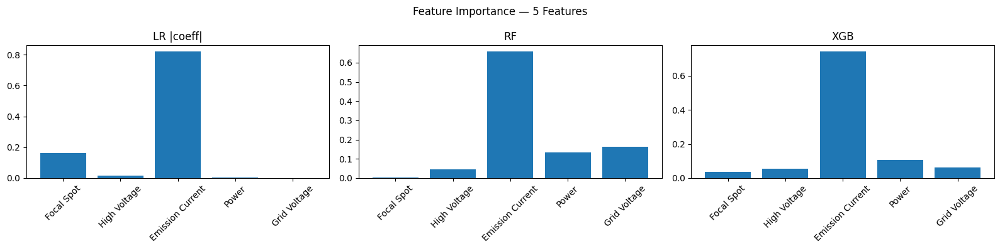


2 Features
  RF  best: {'max_depth': 10, 'min_samples_leaf': 5, 'n_estimators': 100}
  XGB best: {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8}


Model,Split,MAE,MSE,R²
Linear Regression,Train,0.06195,0.00697,0.5428
Linear Regression,Test,0.07715,0.01066,0.5282
Random Forest,Train,0.03585,0.00416,0.7268
Random Forest,Test,0.08156,0.01205,0.4667
XGBoost,Train,0.0384,0.00456,0.7009
XGBoost,Test,0.08126,0.01173,0.4807


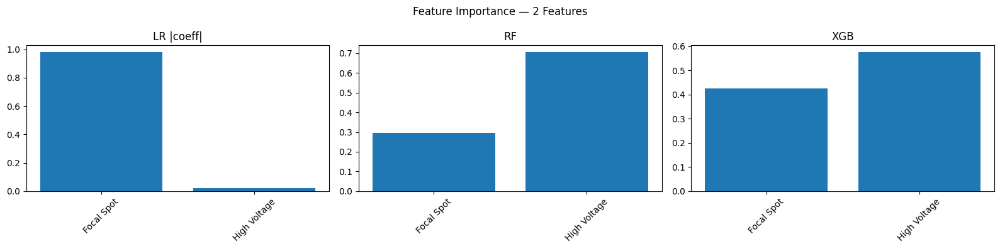

In [0]:
# ── Helper functions (prep_features / to_pandas) ──────────────────────────────
_fitted_indexers = {}

def prep_features(spark_df, feature_list, schema):
    """Identify categorical vs numeric features, apply StringIndexer."""
    from pyspark.sql.types import StringType
    cat_cols = [f for f in feature_list if isinstance(schema[f].dataType, StringType)]
    num_cols = [f for f in feature_list if f not in cat_cols]
    feat_cols = num_cols + [c + "_idx" for c in cat_cols]

    result_df = spark_df
    key = tuple(feature_list)
    if key not in _fitted_indexers:
        stages = [StringIndexer(inputCol=c, outputCol=c + "_idx", handleInvalid="keep")
                  for c in cat_cols]
        if stages:
            _fitted_indexers[key] = Pipeline(stages=stages).fit(result_df)
    if key in _fitted_indexers:
        result_df = _fitted_indexers[key].transform(result_df)
    return result_df, feat_cols, cat_cols


def to_pandas(spark_df, feat_cols, cat_cols=None):
    """Convert Spark DF to pandas; return (pdf, X, y)."""
    keep = list(dict.fromkeys(["device_id", "tube_id", "start_time", "filcu_a"] + feat_cols))
    pdf = spark_df.select(*keep).toPandas()
    X = pdf[feat_cols].values
    y = pdf["filcu_a"].values
    return pdf, X, y


def run_experiment(feature_list, label, df_tr_spark, df_te_spark):
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_tr_sp, feat_cols, _ = prep_features(df_tr_spark, feature_list, df_tr_spark.schema)
    df_te_sp, _,          _ = prep_features(df_te_spark, feature_list, df_tr_spark.schema)
    pdf_tr, X_tr, y_tr = to_pandas(df_tr_sp, feat_cols)
    pdf_te, X_te, y_te = to_pandas(df_te_sp, feat_cols)

    results = {"label": label, "features": feature_list, "feat_cols": feat_cols,
               "pdf_tr": pdf_tr, "pdf_te": pdf_te}

    # Linear Regression
    lr = SkLR(); lr.fit(X_tr, y_tr)
    results["lr"] = {"model": lr, "name": "Linear Regression"}

    # Random Forest grid search
    rf_cv = GridSearchCV(
        SkRF(random_state=42, n_jobs=-1),
        {"n_estimators":[50,100,200], "max_depth":[None,10,20], "min_samples_leaf":[1,5]},
        cv=3, scoring="neg_mean_squared_error", n_jobs=-1, verbose=0
    )
    rf_cv.fit(X_tr, y_tr)
    print(f"  RF  best: {rf_cv.best_params_}")
    results["rf"] = {"model": rf_cv.best_estimator_, "name": "Random Forest"}

    # XGBoost grid search
    xgb_cv = GridSearchCV(
        xgb.XGBRegressor(random_state=42, n_jobs=-1, verbosity=0),
        {"n_estimators":[100,200,300], "max_depth":[4,6,8],
         "learning_rate":[0.05,0.1,0.2], "subsample":[0.8,1.0]},
        cv=3, scoring="neg_mean_squared_error", n_jobs=-1, verbose=0
    )
    xgb_cv.fit(X_tr, y_tr)
    print(f"  XGB best: {xgb_cv.best_params_}")
    results["xgb"] = {"model": xgb_cv.best_estimator_, "name": "XGBoost"}

    rows = []
    for key, info in [("lr",results["lr"]),("rf",results["rf"]),("xgb",results["xgb"])]:
        for split, Xs, ys in [("Train",X_tr,y_tr),("Test",X_te,y_te)]:
            yh = info["model"].predict(Xs)
            rows.append({"Model":info["name"],"Split":split,
                         "MAE":round(mean_absolute_error(ys,yh),5),
                         "MSE":round(mean_squared_error(ys,yh),5),
                         "R²": round(r2_score(ys,yh),4)})
    results["metrics"] = pd.DataFrame(rows)
    display(spark.createDataFrame(results["metrics"]))

    # Feature importance
    # Map variable names to display names for plots
    display_name_map = {
        "focal_spot": "Focal Spot",
        "hv_kv_set": "High Voltage",
        "tucu_ma_set": "Emission Current",
        "pwr_w_reached": "Power",
        "grid_voltage": "Grid Voltage"
    }
    feat_labels = [display_name_map.get(f, f) for f in feat_cols]

    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    fig.suptitle(f"Feature Importance — {label}")
    li = np.abs(lr.coef_); axes[0].bar(feat_labels, li/li.sum()); axes[0].set_title("LR |coeff|")
    axes[1].bar(feat_labels, rf_cv.best_estimator_.feature_importances_); axes[1].set_title("RF")
    axes[2].bar(feat_labels, xgb_cv.best_estimator_.feature_importances_); axes[2].set_title("XGB")
    for ax in axes: ax.tick_params(axis="x", rotation=45)
    plt.tight_layout(); plt.show()
    return results


df_train_bal = balance_by_pair(df_train_raw, enabled=BALANCE_TRAIN)
# test is df_test_raw — all samples, no balancing

res_4feat = run_experiment(FEATURES_4, "5 Features", df_train_bal, df_test_raw)
res_2feat = run_experiment(FEATURES_2, "2 Features", df_train_bal, df_test_raw)

## 7. Best Model Selection (lowest test MSE)

In [0]:
def pick_best_model(res_4, res_2):
    candidates = []
    for res in [res_4, res_2]:
        for key in ["lr","rf","xgb"]:
            row = res["metrics"][(res["metrics"]["Model"]==res[key]["name"]) &
                                 (res["metrics"]["Split"]=="Test")]
            candidates.append((res, key, float(row["MSE"].values[0])))
    candidates.sort(key=lambda x: x[2])
    best_res, best_key, best_mse = candidates[0]
    print(f"Best: {best_res[best_key]['name']} | {best_res['label']} | MSE={best_mse:.5f}")
    return best_res, best_key

best_res, best_key = pick_best_model(res_4feat, res_2feat)
best_model  = best_res[best_key]["model"]
best_label  = best_res["label"]
best_feats  = best_res["feat_cols"]
best_pdf_tr = best_res["pdf_tr"]   # balanced train pandas df
best_pdf_te = best_res["pdf_te"]   # unbalanced test  pandas df (ALL samples)


Best: XGBoost | 5 Features | MSE=0.01002


## 8. Compute Residuals

In [0]:
def compute_residuals(model, pdf, feat_cols):
    pdf = pdf.copy()
    pdf["y_pred"]    = model.predict(pdf[feat_cols].values)
    pdf["residual"]  = pdf["filcu_a"] - pdf["y_pred"]
    pdf["is_damaged"] = pdf.apply(
        lambda r: (r["device_id"], r["tube_id"]) in DAMAGED_SET, axis=1)
    return pdf

tr_res = compute_residuals(best_model, best_pdf_tr, best_feats)
te_res = compute_residuals(best_model, best_pdf_te, best_feats)

print(f"Train residuals — mean={tr_res['residual'].mean():.4f}  "
      f"std={tr_res['residual'].std():.4f}  "
      f"p99={np.percentile(np.abs(tr_res['residual']),99):.4f}")


Train residuals — mean=0.0001  std=0.0537  p99=0.2251


## 9. Operating-Group Residual Normalisation
Different (focal_spot, kV) operating regimes produce
different residual magnitudes. We z-score each residual against the mean and std
of residuals in the *training set* for the same operating group.
This makes a single threshold meaningful across all regimes.


Train resid_z — mean=-0.000  std=1.000


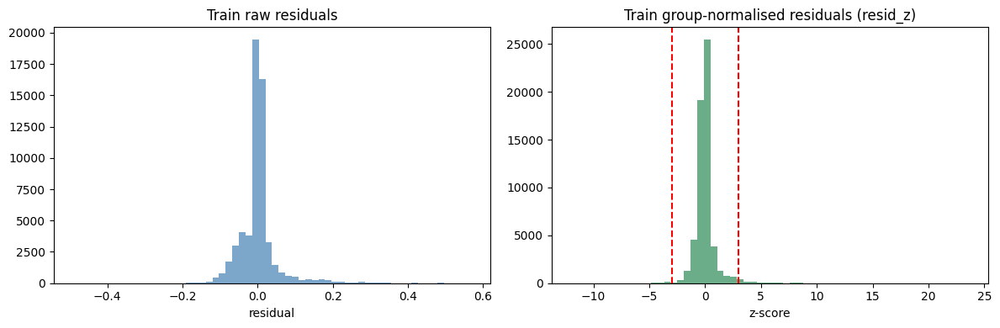

In [0]:
def add_kv_bucket(pdf, bucket_size=KV_BUCKET_SIZE):
    pdf = pdf.copy()
    pdf["kv_bucket"] = (pdf["hv_kv_set"] // bucket_size * bucket_size).astype(int)
    return pdf

tr_res = add_kv_bucket(tr_res)
te_res = add_kv_bucket(te_res)

# Compute per-(focal_spot, kv_bucket) mean and std of residuals from train
group_stats = (
    tr_res.groupby(["focal_spot","kv_bucket"])["residual"]
    .agg(grp_mean="mean", grp_std="std")
    .reset_index()
)
# std=0 or NaN → replace with global std so we don't divide by zero
global_std = tr_res["residual"].std()
group_stats["grp_std"] = group_stats["grp_std"].fillna(global_std).replace(0, global_std)

def apply_group_zscore(pdf, stats):
    pdf = pdf.merge(stats, on=["focal_spot","kv_bucket"], how="left")
    # pairs with unseen groups → use global stats
    pdf["grp_mean"] = pdf["grp_mean"].fillna(0)
    pdf["grp_std"]  = pdf["grp_std"].fillna(global_std)
    pdf["resid_z"]  = (pdf["residual"] - pdf["grp_mean"]) / pdf["grp_std"]
    return pdf

tr_res = apply_group_zscore(tr_res, group_stats)
te_res = apply_group_zscore(te_res, group_stats)

# Verify: train resid_z should be ~N(0,1)
print(f"Train resid_z — mean={tr_res['resid_z'].mean():.3f}  "
      f"std={tr_res['resid_z'].std():.3f}")

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(tr_res["residual"],  bins=60, color="steelblue", alpha=0.7)
axes[0].set_title("Train raw residuals"); axes[0].set_xlabel("residual")
axes[1].hist(tr_res["resid_z"],   bins=60, color="seagreen",  alpha=0.7)
axes[1].axvline(-3, color="r", ls="--"); axes[1].axvline(3, color="r", ls="--")
axes[1].set_title("Train group-normalised residuals (resid_z)")
axes[1].set_xlabel("z-score"); plt.tight_layout(); plt.show()


## 10. Pair-Specific Baseline Subtraction
Each tube has a unique filcu_a (heater current) offset due to
manufacturing variance. We compute the median of the first `BASELINE_N`
group-normalised residuals (`resid_z`) per pair and subtract it.
After this, `resid_z_adj ≈ 0` for a healthy pair and drifts positive
for a failing one, regardless of absolute filcu_a level.


/root/.ipykernel/1182/command-8839668233379469-2354002459:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_sub)
/root/.ipykernel/1182/command-8839668233379469-2354002459:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_sub)


Train resid_z_adj std: 1.2226  (CUSUM k = 0.6113, h = 4.8903)


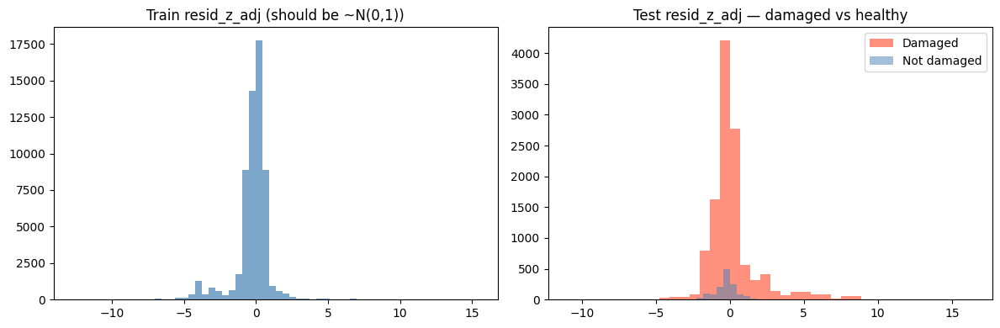

In [0]:
def subtract_pair_baseline(pdf, n=BASELINE_N):
    """Subtract per-pair early-life median of resid_z. Applied to test only."""
    def _sub(g):
        g = g.sort_values("start_time").copy()
        baseline = g["resid_z"].iloc[:n].median()
        g["resid_z_adj"] = g["resid_z"] - baseline
        g["pair_baseline"] = baseline
        return g
    return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_sub)

# Apply to BOTH sets so we can fit CUSUM params on train
tr_res = subtract_pair_baseline(tr_res, n=BASELINE_N)
te_res = subtract_pair_baseline(te_res, n=BASELINE_N)

# Train std of adjusted residuals → used to scale CUSUM thresholds
train_resid_std = tr_res["resid_z_adj"].std()
print(f"Train resid_z_adj std: {train_resid_std:.4f}  "
      f"(CUSUM k = {CUSUM_K * train_resid_std:.4f}, "
      f"h = {CUSUM_H * train_resid_std:.4f})")

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(tr_res["resid_z_adj"], bins=60, color="steelblue", alpha=0.7)
axes[0].set_title("Train resid_z_adj (should be ~N(0,1))")
axes[1].hist(te_res[te_res["is_damaged"]]["resid_z_adj"], bins=40,
             color="tomato", alpha=0.7, label="Damaged")
axes[1].hist(te_res[~te_res["is_damaged"]]["resid_z_adj"], bins=40,
             color="steelblue", alpha=0.5, label="Not damaged")
axes[1].legend(); axes[1].set_title("Test resid_z_adj — damaged vs healthy")
plt.tight_layout(); plt.show()

## 10b. [EXPERIMENTAL] Improved Baseline: OLS Detrending per Pair
**Why this helps:**
The existing baseline subtracts only the *median* of the first N residuals.
If those first N samples already show a slight upward slope (early drift or
settling), the median under-estimates the true healthy level and the adjusted
residual starts above zero — making the CUSUM fire immediately or not at all.

**Fix:** fit a linear trend through the first `EXP_BASELINE_N` residuals per pair
and subtract it (intercept + slope × sample_index) from *all* subsequent residuals.
This removes both level offset *and* initial slope, so `resid_z_detrend ≈ 0` for a
healthy pair and drifts **monotonically positive** for a failing one.


/root/.ipykernel/1182/command-8839668233379471-1533248828:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_detrend)
/root/.ipykernel/1182/command-8839668233379471-1533248828:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_detrend)
/root/.ipykernel/1182/command-88396682

Exp train resid_z_detrend — mean=-20.0643  std=41.6882


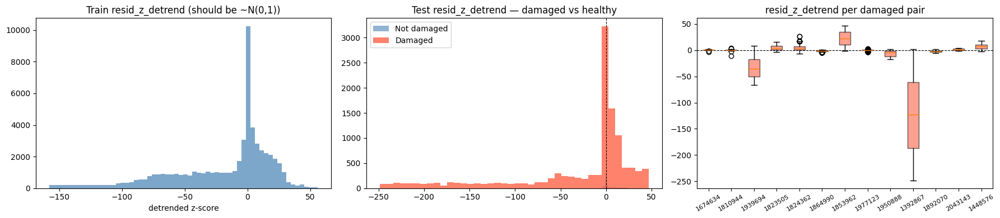

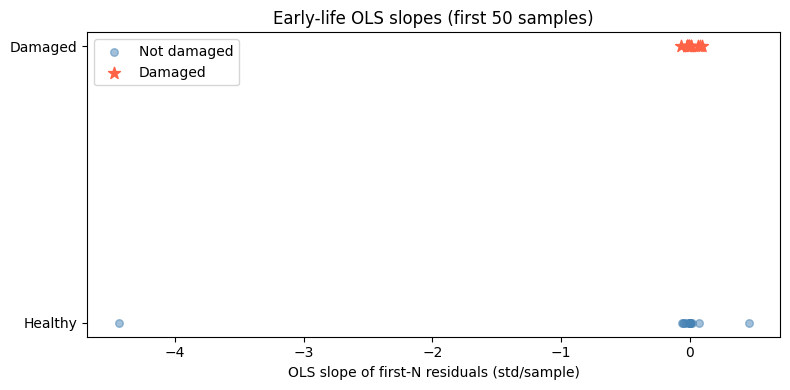

In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] OLS-detrended pair baseline
# Depends on: te_res, tr_res (with resid_z column from §9)
# Produces:   te_exp, tr_exp  — new dataframes with resid_z_detrend column
# ══════════════════════════════════════════════════════════════════════════════
from numpy.polynomial import polynomial as P

def subtract_pair_ols_baseline(pdf, n=EXP_BASELINE_N):
    """
    Per pair, sorted by start_time:
      1. Fit OLS line through the first n resid_z values (index 0..n-1).
      2. Extrapolate that line over ALL samples.
      3. resid_z_detrend = resid_z - extrapolated_line
    After this, a healthy pair has resid_z_detrend ≈ 0 throughout.
    A drifting pair shows resid_z_detrend rising above 0 after sample n.
    """
    def _detrend(g):
        g = g.sort_values("start_time").reset_index(drop=True).copy()
        idx  = np.arange(len(g))
        early_idx  = idx[:n]
        early_vals = g["resid_z"].values[:n]

        if len(early_vals) >= 2:
            # OLS: fit degree-1 polynomial to first-n samples
            coeffs = np.polyfit(early_idx, early_vals, deg=1)   # [slope, intercept]
            trend  = np.polyval(coeffs, idx)                      # extrapolate all
        else:
            # not enough samples → fall back to median subtraction
            trend = np.full(len(g), np.median(early_vals))

        g["resid_z_detrend"] = g["resid_z"].values - trend
        g["ols_slope"]       = coeffs[0] if len(early_vals) >= 2 else 0.0
        g["ols_intercept"]   = coeffs[1] if len(early_vals) >= 2 else trend[0]
        return g

    return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_detrend)


# Apply to both train and test
tr_exp = subtract_pair_ols_baseline(tr_res, n=EXP_BASELINE_N)
te_exp = subtract_pair_ols_baseline(te_res, n=EXP_BASELINE_N)

# Reference std from TRAINING detrended residuals (used to scale thresholds)
exp_train_std = tr_exp["resid_z_detrend"].std()
print(f"Exp train resid_z_detrend — mean={tr_exp['resid_z_detrend'].mean():.4f}  "
      f"std={exp_train_std:.4f}")

# ── Visual check: detrended residuals for damaged vs healthy in test ───────────
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

axes[0].hist(tr_exp["resid_z_detrend"], bins=60, color="steelblue", alpha=0.7)
axes[0].set_title("Train resid_z_detrend (should be ~N(0,1))")
axes[0].set_xlabel("detrended z-score")

axes[1].hist(te_exp[~te_exp["is_damaged"]]["resid_z_detrend"],
             bins=40, color="steelblue", alpha=0.6, label="Not damaged")
axes[1].hist(te_exp[ te_exp["is_damaged"]]["resid_z_detrend"],
             bins=40, color="tomato",    alpha=0.8, label="Damaged")
axes[1].axvline(0, color="k", ls="--", lw=0.8)
axes[1].legend(); axes[1].set_title("Test resid_z_detrend — damaged vs healthy")

# Box plot per damaged pair
pairs_dam = te_exp[te_exp["is_damaged"]]
pair_labels = pairs_dam["tube_id"].unique()
data_boxes  = [pairs_dam[pairs_dam["tube_id"]==t]["resid_z_detrend"].values
               for t in pair_labels]
axes[2].boxplot(data_boxes, labels=pair_labels, patch_artist=True,
                boxprops=dict(facecolor="tomato", alpha=0.6))
axes[2].axhline(0, color="k", ls="--", lw=0.8)
axes[2].set_title("resid_z_detrend per damaged pair")
axes[2].tick_params(axis="x", rotation=30, labelsize=8)

plt.tight_layout(); plt.show()

# ── OLS slopes: confirm damaged pairs have steeper early-life slopes ───────────
slope_df = te_exp.groupby(["device_id","tube_id","is_damaged"])["ols_slope"].first().reset_index()
fig, ax = plt.subplots(figsize=(8, 4))
ax.scatter(slope_df[~slope_df["is_damaged"]]["ols_slope"],
           [0]*slope_df[~slope_df["is_damaged"]].shape[0],
           c="steelblue", alpha=0.5, s=30, label="Not damaged")
ax.scatter(slope_df[ slope_df["is_damaged"]]["ols_slope"],
           [1]*slope_df[ slope_df["is_damaged"]].shape[0],
           c="tomato", s=80, marker="*", label="Damaged")
ax.set_xlabel("OLS slope of first-N residuals (std/sample)")
ax.set_title(f"Early-life OLS slopes (first {EXP_BASELINE_N} samples)")
ax.set_yticks([0,1]); ax.set_yticklabels(["Healthy","Damaged"])
ax.legend(); plt.tight_layout(); plt.show()


## 11. Three Detection Signals per Pair

### Signal 1 — CUSUM (cumulative sum)
Detects a **sustained positive shift** in `resid_z_adj`.
\[ S_i = \max(0,\; S_{i-1} + (r_i - k)) \quad \text{alarm when } S_i > h \]
- `k` = allowance (half expected shift in std-dev units × `train_resid_std`)
- `h` = decision threshold in the same units

### Signal 2 — Rolling signed residual z-score
Rolling mean of `resid_z_adj` over `ROLLING_WINDOW` samples — alarm when it
exceeds `ROLLING_SIGNED_ZSCORE_THRESH`. Unlike the previous version's rolling
mean of *absolute* residual, this only fires on **sustained upward drift**, not noise spikes.

### Signal 3 — Monotone trend test (Mann-Kendall τ on rolling window)
Within each rolling window, test for a significant upward trend.
Simple version: fraction of positive first-differences in window > 0.65.


In [0]:
def compute_signals(pdf, cusum_k_abs, cusum_h_abs,
                    roll_window=ROLLING_WINDOW,
                    roll_z_thresh=ROLLING_SIGNED_ZSCORE_THRESH,
                    trend_frac=0.65,
                    min_det=MIN_DETECTIONS):
    """
    Compute three drift signals per (device_id, tube_id) pair.
    Returns augmented dataframe with columns:
      cusum, cusum_alarm, roll_signed_z, roll_alarm, trend_alarm, any_alarm, all_alarm
    """
    def _signals(g):

        g = g.sort_values("start_time").copy()
        r = g["resid_z_adj"].values
        n = len(r)

        # ── Signal 1: CUSUM ──────────────────────────────────────────────────
        S = np.zeros(n)
        for i in range(1, n):
            S[i] = max(0.0, S[i-1] + r[i] - cusum_k_abs)
        g["cusum"] = S
        raw_cusum_alarm = S > cusum_h_abs
        # require MIN_DETECTIONS consecutive to confirm
        consec = np.zeros(n, dtype=int)
        for i in range(n):
            consec[i] = (consec[i-1] + 1) if (i > 0 and raw_cusum_alarm[i]) else                         (1 if raw_cusum_alarm[i] else 0)
        g["cusum_alarm"] = consec >= min_det

        # ── Signal 2: rolling signed residual z-score ────────────────────────
        roll_mean = pd.Series(r).rolling(roll_window, min_periods=max(1,roll_window//2)).mean()
        g["roll_signed_z"] = roll_mean  # already in z-score units (resid_z_adj)
        raw_roll_alarm = roll_mean > roll_z_thresh
        consec2 = np.zeros(n, dtype=int)
        for i in range(n):
            consec2[i] = (consec2[i-1] + 1) if (i > 0 and raw_roll_alarm.iloc[i]) else                          (1 if raw_roll_alarm.iloc[i] else 0)
        g["roll_alarm"] = consec2 >= min_det

        # ── Signal 3: monotone trend in rolling window ───────────────────────
        trend_alarm = np.zeros(n, dtype=bool)
        for i in range(roll_window, n):
            window_vals = r[i-roll_window:i]
            pos_frac = np.mean(np.diff(window_vals) > 0)
            if pos_frac >= trend_frac:
                trend_alarm[i] = True
        # confirm with min_det
        consec3 = np.zeros(n, dtype=int)
        for i in range(n):
            consec3[i] = (consec3[i-1] + 1) if (i > 0 and trend_alarm[i]) else                          (1 if trend_alarm[i] else 0)
        g["trend_alarm"] = consec3 >= min_det

        # ── Fused alarm ──────────────────────────────────────────────────────
        g["any_alarm"]      = g["cusum_alarm"] | g["roll_alarm"] | g["trend_alarm"]
        g["majority_alarm"] = (g["cusum_alarm"].astype(int) +
                               g["roll_alarm"].astype(int) +
                               g["trend_alarm"].astype(int)) >= 2
        g["all_alarm"]      = g["cusum_alarm"] & g["roll_alarm"] & g["trend_alarm"]
        return g

    return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)


# Scale CUSUM thresholds by train std
cusum_k_abs = CUSUM_K * train_resid_std
cusum_h_abs = CUSUM_H * train_resid_std

te_sig = compute_signals(te_res, cusum_k_abs, cusum_h_abs)
tr_sig = compute_signals(tr_res, cusum_k_abs, cusum_h_abs)

# Verify: how many train pairs trigger false alarms?
train_fp = (tr_sig.groupby(["device_id","tube_id"])["any_alarm"].any().sum())
print(f"Train pairs with ANY alarm (should be ~0 with h={CUSUM_H}): {train_fp}")


/root/.ipykernel/1182/command-8839668233379473-690590411:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)


Train pairs with ANY alarm (should be ~0 with h=4.0): 28


/root/.ipykernel/1182/command-8839668233379473-690590411:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)


## 11b. [EXPERIMENTAL] Four Improved Detection Signals

| Signal | Description | Why better |
|--------|-------------|------------|
| **CUSUM+** | One-sided positive CUSUM with reset on sustained negative values | Avoids false accumulation; reset prevents long-memory noise |
| **Regime CUSUM** | Same CUSUM but with per-(focal_spot, kV_bucket) threshold scaling | Tight threshold in low-variance regimes, looser in high-variance ones |
| **Rolling slope** | OLS slope of `resid_z_detrend` over a rolling window | Directly measures drift rate; fires earlier on slow monotone rise |
| **Rolling signed z** | Rolling mean of `resid_z_detrend` (same as §11 signal 2, but on detrended signal) | Cleaner signal now that baseline is removed via OLS |




In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] Improved signal computation
# Depends on: te_exp, tr_exp (from §10b), exp_train_std, group_stats
# Produces:   te_exp_sig, tr_exp_sig
# ══════════════════════════════════════════════════════════════════════════════

# ── Per-regime threshold scaling ──────────────────────────────────────────────
# Compute std of resid_z_detrend per (focal_spot, kv_bucket) from train
regime_std = (
    tr_exp.groupby(["focal_spot","kv_bucket"])["resid_z_detrend"]
    .std()
    .reset_index()
    .rename(columns={"resid_z_detrend": "regime_std"})
)
regime_std["regime_std"] = regime_std["regime_std"].fillna(exp_train_std).replace(0, exp_train_std)

def get_regime_h(focal_spot, kv_bucket, base_h_abs):
    """Scale CUSUM h by local regime std relative to global std."""
    row = regime_std[(regime_std["focal_spot"] == focal_spot) &
                     (regime_std["kv_bucket"]  == kv_bucket)]
    if row.empty:
        return base_h_abs
    r_std = float(row["regime_std"].values[0])
    # scale: tight threshold in low-variance regime, looser in high-variance
    return base_h_abs * (r_std / exp_train_std)


def compute_signals_exp(pdf, cusum_k_abs, cusum_h_abs,
                        slope_window=EXP_SLOPE_WINDOW,
                        slope_thresh=EXP_SLOPE_THRESH,
                        roll_window=ROLLING_WINDOW,
                        roll_z_thresh=ROLLING_SIGNED_ZSCORE_THRESH,
                        use_regime_thresh=EXP_USE_REGIME_THRESH,
                        reset_n=EXP_CUSUM_RESET_N,
                        min_det=EXP_MIN_DETECTIONS):
    """
    Four signals on resid_z_detrend (OLS-baseline-removed, group-normalised):
      1. cusum_exp        — one-sided CUSUM with negative-run reset
      2. cusum_regime_exp — same with per-regime threshold
      3. slope_exp        — rolling OLS slope alarm
      4. roll_exp         — rolling signed mean alarm
    Fusion columns: any_exp, majority_exp, all_exp
    """
    def _signals_exp(g):
        g = g.sort_values("start_time").reset_index(drop=True).copy()
        r = g["resid_z_detrend"].values
        n = len(r)

        # Regime-specific threshold for this pair
        fs  = g["focal_spot"].iloc[0]
        kvb = int(g["kv_bucket"].iloc[0]) if "kv_bucket" in g.columns else 0
        h_regime = get_regime_h(fs, kvb, cusum_h_abs) if use_regime_thresh else cusum_h_abs

        # ── Signal 1 & 2: CUSUM with reset ───────────────────────────────────
        S       = np.zeros(n)
        S_reg   = np.zeros(n)
        neg_run = 0
        for i in range(1, n):
            # count consecutive negative-residual samples → reset
            neg_run = neg_run + 1 if r[i] < 0 else 0
            if neg_run >= reset_n:
                S[i]     = 0.0
                S_reg[i] = 0.0
                neg_run  = 0
            else:
                S[i]     = max(0.0, S[i-1]   + r[i] - cusum_k_abs)
                S_reg[i] = max(0.0, S_reg[i-1] + r[i] - cusum_k_abs)

        g["cusum_exp"]       = S
        g["cusum_regime_exp"]= S_reg

        def _gate(arr_bool):
            consec = np.zeros(n, dtype=int)
            for i in range(n):
                consec[i] = (consec[i-1]+1) if (i>0 and arr_bool[i]) else (1 if arr_bool[i] else 0)
            return consec >= min_det

        g["cusum_exp_alarm"]        = _gate(S     > cusum_h_abs)
        g["cusum_regime_exp_alarm"] = _gate(S_reg > h_regime)

        # ── Signal 3: rolling OLS slope ───────────────────────────────────────
        slopes = np.zeros(n)
        for i in range(slope_window, n):
            w_idx  = np.arange(slope_window)
            w_vals = r[i-slope_window:i]
            if np.std(w_vals) > 0:
                slopes[i] = np.polyfit(w_idx, w_vals, 1)[0]  # slope = coeff[0]
        g["rolling_slope"] = slopes
        g["slope_exp_alarm"] = _gate(slopes > slope_thresh)

        # ── Signal 4: rolling signed mean ─────────────────────────────────────
        roll_mean = pd.Series(r).rolling(roll_window, min_periods=max(2, roll_window//2)).mean()
        g["roll_exp_mean"]  = roll_mean.values
        g["roll_exp_alarm"] = _gate(roll_mean.values > roll_z_thresh)

        # ── Fusion ────────────────────────────────────────────────────────────
        alarm_cols = ["cusum_exp_alarm", "cusum_regime_exp_alarm",
                      "slope_exp_alarm", "roll_exp_alarm"]
        votes = sum(g[c].astype(int) for c in alarm_cols)
        g["any_exp"]      = votes >= 1
        g["majority_exp"] = votes >= 2
        g["all_exp"]      = votes >= 4
        return g

    return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)


# ── Compute on train (to estimate false-alarm rate) and test ──────────────────
exp_cusum_k_abs = EXP_CUSUM_K * exp_train_std
exp_cusum_h_abs = EXP_CUSUM_H * exp_train_std

tr_exp_sig = compute_signals_exp(tr_exp, exp_cusum_k_abs, exp_cusum_h_abs)
te_exp_sig = compute_signals_exp(te_exp, exp_cusum_k_abs, exp_cusum_h_abs)

# False-alarm rate on train (healthy pairs only)
tr_fa = tr_exp_sig.groupby(["device_id","tube_id"])["any_exp"].any().sum()
tr_total = tr_exp_sig[["device_id","tube_id"]].drop_duplicates().shape[0]
print(f"Train false-alarm rate (any_exp): {tr_fa}/{tr_total} = {tr_fa/tr_total:.1%}")
print(f"  cusum_exp:        {tr_exp_sig.groupby(['device_id','tube_id'])['cusum_exp_alarm'].any().sum()}/{tr_total}")
print(f"  cusum_regime_exp: {tr_exp_sig.groupby(['device_id','tube_id'])['cusum_regime_exp_alarm'].any().sum()}/{tr_total}")
print(f"  slope_exp:        {tr_exp_sig.groupby(['device_id','tube_id'])['slope_exp_alarm'].any().sum()}/{tr_total}")
print(f"  roll_exp:         {tr_exp_sig.groupby(['device_id','tube_id'])['roll_exp_alarm'].any().sum()}/{tr_total}")


/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)


Train false-alarm rate (any_exp): 49/116 = 42.2%
  cusum_exp:        10/116
  cusum_regime_exp: 10/116
  slope_exp:        46/116
  roll_exp:         19/116


/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)


## 12. Pair-Level Drift Detection

In [0]:
alarm_col_map = {"OR": "any_alarm", "AND": "all_alarm", "MAJORITY": "majority_alarm"}
alarm_col = alarm_col_map[FUSION_MODE]
print(f"Fusion mode: {FUSION_MODE}  →  using column '{alarm_col}'")

def pair_level_detection(pdf, alarm_col):
    records = []
    for (did, tid), g in pdf.groupby(["device_id","tube_id"]):
        g = g.sort_values("start_time").reset_index(drop=True)
        is_damaged = bool(g["is_damaged"].iloc[0])
        fired = g[alarm_col]
        if fired.any():
            first_idx  = fired.idxmax()
            first_time = pd.to_datetime(g["start_time"].iloc[first_idx])
            last_time  = pd.to_datetime(g["start_time"].iloc[-1])
            lead_days  = (last_time - first_time).days
            detected   = True
        else:
            first_time = pd.NaT
            last_time  = pd.to_datetime(g["start_time"].iloc[-1])
            lead_days  = np.nan
            detected   = False
        records.append({"device_id":did, "tube_id":tid,
                        "is_damaged":is_damaged, "drift_detected":detected,
                        "first_detection":first_time, "last_filcu_a":last_time,
                        "lead_days":lead_days})
    return pd.DataFrame(records)

pair_df = pair_level_detection(te_sig, alarm_col)
dam_df  = pair_df[pair_df["is_damaged"]]
print("\nDamaged pair detection results:")
display(spark.createDataFrame(
    dam_df[["device_id","tube_id","drift_detected","first_detection","last_filcu_a","lead_days"]]
))


Fusion mode: OR  →  using column 'any_alarm'

Damaged pair detection results:


device_id,tube_id,drift_detected,first_detection,last_filcu_a,lead_days
t3-1678901-1966,1674634,false,null,2023-09-15T11:31:20.093104Z,null
t3-1817879-52,1810944,false,null,2023-09-08T13:35:02.283879Z,null
t3-1829086-180,1939694,true,2024-08-22T13:32:15.104093Z,2025-07-15T10:45:55.971137Z,326.0
t3-1830503-165,1823505,true,2023-11-23T13:42:12.69294Z,2024-01-12T17:03:20.545506Z,50.0
t3-1831151-186,1824362,true,2024-07-26T16:13:15.879039Z,2024-08-28T03:02:00.81339Z,32.0
t3-1882150-500,1864990,false,null,2024-04-12T16:00:08.629108Z,null
t3-1882151-611,1853962,false,null,2025-05-27T11:31:03.481158Z,null
t3-1991730-874,1977123,false,null,2024-11-20T18:11:12.132577Z,null
t3-1993491-843,1950888,true,2024-10-17T12:11:05.743278Z,2024-11-04T10:19:45.568065Z,17.0
t3-2002-1557,1392867,true,2022-06-27T13:42:09.676287Z,2023-05-25T10:34:23.809131Z,331.0


## 12b. [EXPERIMENTAL] Pair-Level Detection Results
Uses the same `pair_level_detection()` function from §12.


Exp fusion: OR  →  'any_exp'

Damaged pair detection results [EXPERIMENTAL]:


device_id,tube_id,drift_detected,first_detection,last_filcu_a,lead_days
t3-1678901-1966,1674634,true,2023-07-14T11:00:11.007851Z,2023-09-15T11:31:20.093104Z,63.0
t3-1817879-52,1810944,true,2023-09-06T10:04:41.528607Z,2023-09-08T13:35:02.283879Z,2.0
t3-1829086-180,1939694,true,2024-09-05T16:33:39.449426Z,2025-07-15T10:45:55.971137Z,312.0
t3-1830503-165,1823505,true,2023-12-12T15:00:51.875257Z,2024-01-12T17:03:20.545506Z,31.0
t3-1831151-186,1824362,true,2024-01-18T09:13:37.920708Z,2024-08-28T03:02:00.81339Z,222.0
t3-1882150-500,1864990,true,2024-02-27T11:54:34.626859Z,2024-04-12T16:00:08.629108Z,45.0
t3-1882151-611,1853962,true,2024-12-10T08:49:42.293494Z,2025-05-27T11:31:03.481158Z,168.0
t3-1991730-874,1977123,true,2024-10-28T09:04:43.960713Z,2024-11-20T18:11:12.132577Z,23.0
t3-1993491-843,1950888,true,2024-10-17T13:49:56.40185Z,2024-11-04T10:19:45.568065Z,17.0
t3-2002-1557,1392867,true,2022-07-08T10:09:46.89188Z,2023-05-25T10:34:23.809131Z,321.0


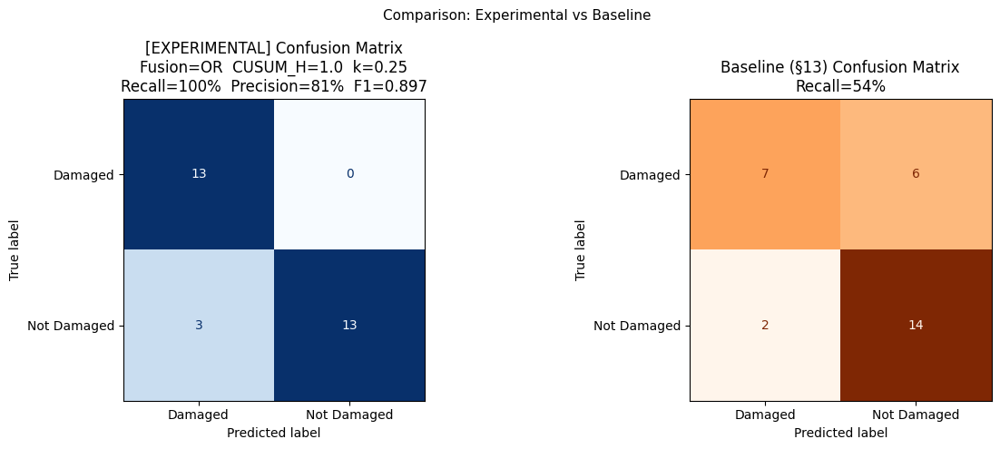


Baseline recall : 53.8%
Experimental recall: 100.0%  (FP=3)


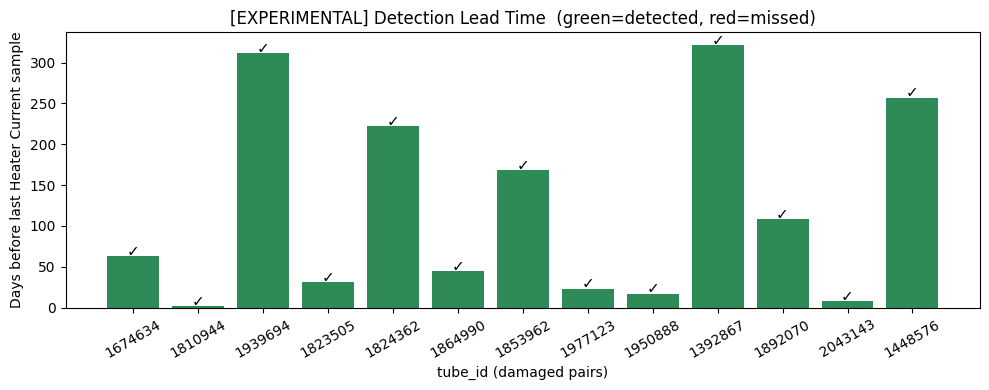

In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] Pair-level detection and confusion matrix
# ══════════════════════════════════════════════════════════════════════════════

exp_alarm_col_map = {"OR":"any_exp", "AND":"all_exp", "MAJORITY":"majority_exp"}
exp_alarm_col     = exp_alarm_col_map[EXP_FUSION_MODE]
print(f"Exp fusion: {EXP_FUSION_MODE}  →  '{exp_alarm_col}'")

exp_pair_df = pair_level_detection(te_exp_sig, exp_alarm_col)
exp_dam_df  = exp_pair_df[exp_pair_df["is_damaged"]]

print("\nDamaged pair detection results [EXPERIMENTAL]:")
display(spark.createDataFrame(
    exp_dam_df[["device_id","tube_id","drift_detected",
                "first_detection","last_filcu_a","lead_days"]]
))

# ── Confusion matrix ──────────────────────────────────────────────────────────
y_true_e = exp_pair_df["is_damaged"].astype(int)
y_pred_e = exp_pair_df["drift_detected"].astype(int)
cm_e = confusion_matrix(y_true_e, y_pred_e, labels=[1,0])
TP_e,FN_e = cm_e[0,0], cm_e[0,1]
FP_e,TN_e = cm_e[1,0], cm_e[1,1]
rec_e = TP_e/(TP_e+FN_e) if (TP_e+FN_e)>0 else 0
pre_e = TP_e/(TP_e+FP_e) if (TP_e+FP_e)>0 else 0
f1_e  = 2*pre_e*rec_e/(pre_e+rec_e) if (pre_e+rec_e)>0 else 0

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ConfusionMatrixDisplay(cm_e, display_labels=["Damaged","Not Damaged"]).plot(
    ax=axes[0], colorbar=False, cmap="Blues")
axes[0].set_title(
    f"[EXPERIMENTAL] Confusion Matrix\n"
    f"Fusion={EXP_FUSION_MODE}  CUSUM_H={EXP_CUSUM_H}  k={EXP_CUSUM_K}\n"
    f"Recall={rec_e:.0%}  Precision={pre_e:.0%}  F1={f1_e:.3f}"
)

# Side-by-side vs baseline
cm_b = confusion_matrix(pair_df["is_damaged"].astype(int),
                        pair_df["drift_detected"].astype(int), labels=[1,0])
ConfusionMatrixDisplay(cm_b, display_labels=["Damaged","Not Damaged"]).plot(
    ax=axes[1], colorbar=False, cmap="Oranges")
rec_b = cm_b[0,0]/(cm_b[0,0]+cm_b[0,1]) if (cm_b[0,0]+cm_b[0,1])>0 else 0
axes[1].set_title(
    f"Baseline (§13) Confusion Matrix\nRecall={rec_b:.0%}"
)
plt.suptitle("Comparison: Experimental vs Baseline", fontsize=11)
plt.tight_layout(); plt.show()

print(f"\nBaseline recall : {rec_b:.1%}")
print(f"Experimental recall: {rec_e:.1%}  (FP={FP_e})")

# ── Lead time bar chart ───────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 4))
colors_e = exp_dam_df["drift_detected"].map({True:"seagreen", False:"tomato"})
bars = ax.bar(exp_dam_df["tube_id"], exp_dam_df["lead_days"].fillna(0), color=colors_e)
for bar, row in zip(bars, exp_dam_df.itertuples()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3,
            "✓" if row.drift_detected else "✗", ha="center", fontsize=11)
ax.set_xlabel("tube_id (damaged pairs)")
ax.set_ylabel("Days before last Heater Current sample")
ax.set_title("[EXPERIMENTAL] Detection Lead Time  (green=detected, red=missed)")
ax.tick_params(axis="x", rotation=30)
plt.tight_layout(); plt.show()


## 13. Confusion Matrix

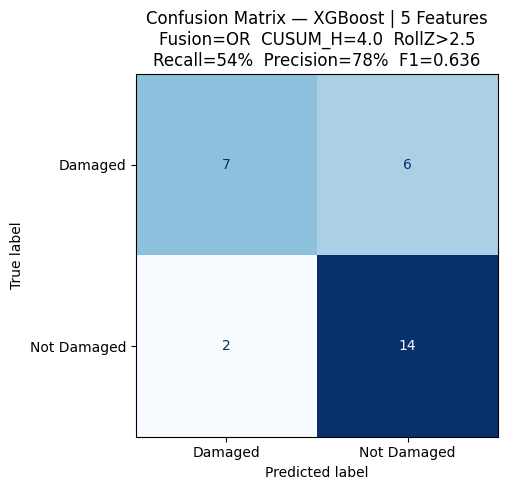

Recall=53.8%  Precision=77.8%  F1=0.636
TP=7  FN=6  FP=2  TN=14


In [0]:
y_true = pair_df["is_damaged"].astype(int)
y_pred = pair_df["drift_detected"].astype(int)
cm = confusion_matrix(y_true, y_pred, labels=[1,0])
TP,FN = cm[0,0], cm[0,1]
FP,TN = cm[1,0], cm[1,1]
rec = TP/(TP+FN) if (TP+FN)>0 else 0
pre = TP/(TP+FP) if (TP+FP)>0 else 0
f1  = 2*pre*rec/(pre+rec) if (pre+rec)>0 else 0

fig, ax = plt.subplots(figsize=(6,5))
ConfusionMatrixDisplay(cm, display_labels=["Damaged","Not Damaged"]).plot(
    ax=ax, colorbar=False, cmap="Blues")
ax.set_title(
    f"Confusion Matrix — {best_res[best_key]['name']} | {best_label}\n"
    f"Fusion={FUSION_MODE}  CUSUM_H={CUSUM_H}  RollZ>{ROLLING_SIGNED_ZSCORE_THRESH}\n"
    f"Recall={rec:.0%}  Precision={pre:.0%}  F1={f1:.3f}"
)
plt.tight_layout(); plt.show()

print(f"Recall={rec:.1%}  Precision={pre:.1%}  F1={f1:.3f}")
print(f"TP={TP}  FN={FN}  FP={FP}  TN={TN}")


## 14. Detection Lead Time — Damaged Pairs
original, before [EXPERIMENTAL]

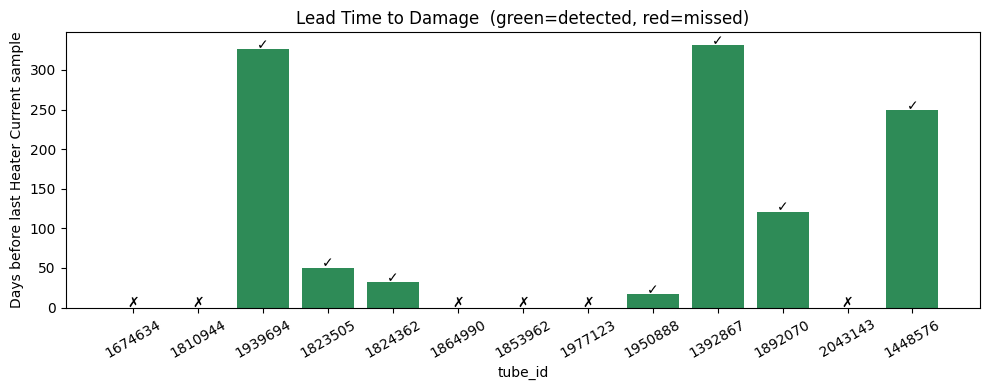

In [0]:
fig, ax = plt.subplots(figsize=(10, 4))
colors_bar = dam_df["drift_detected"].map({True:"seagreen", False:"tomato"})
bars = ax.bar(dam_df["tube_id"], dam_df["lead_days"].fillna(0), color=colors_bar)
for bar, row in zip(bars, dam_df.itertuples()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
            "✓" if row.drift_detected else "✗", ha="center", fontsize=10)
ax.set_xlabel("tube_id"); ax.set_ylabel("Days before last Heater Current sample")
ax.set_title("Lead Time to Damage  (green=detected, red=missed)")
ax.tick_params(axis="x", rotation=30)
plt.tight_layout(); plt.show()


## 15b. [EXPERIMENTAL] Deep Dive — Each Damaged Pair (4 signals)
Shows the OLS-detrended residual,
all four new signals, and exactly which one fires first.


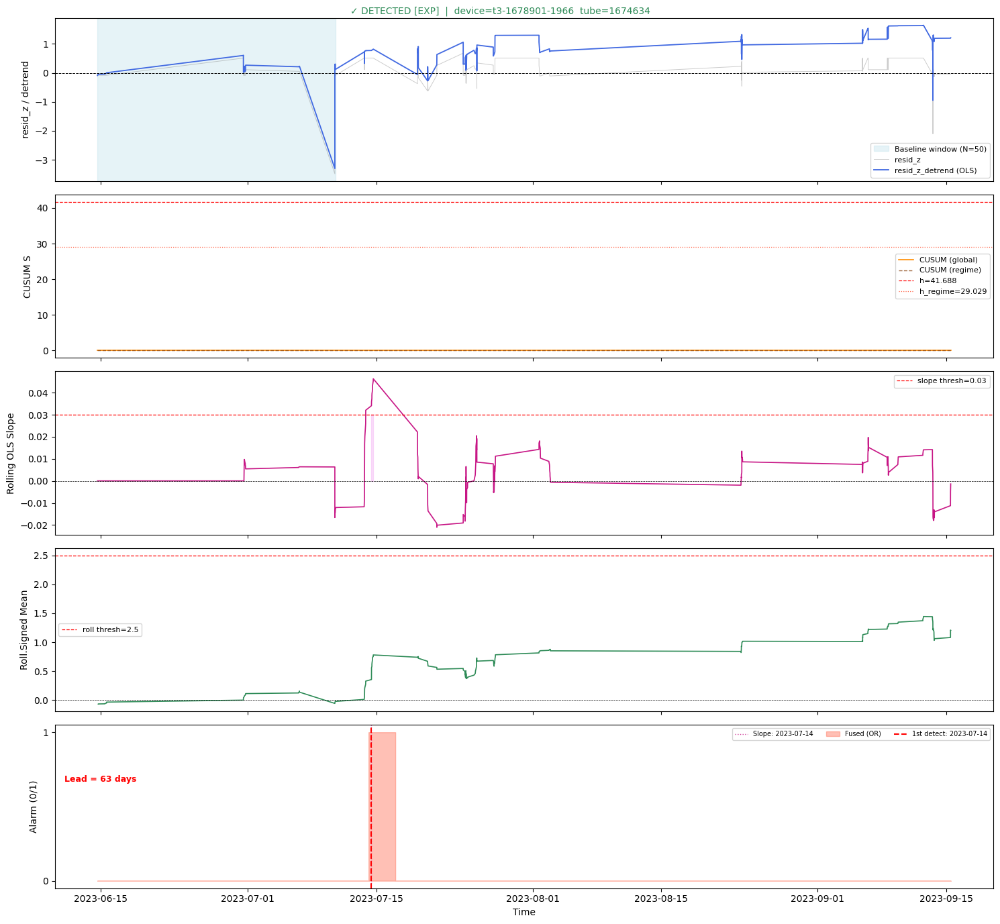

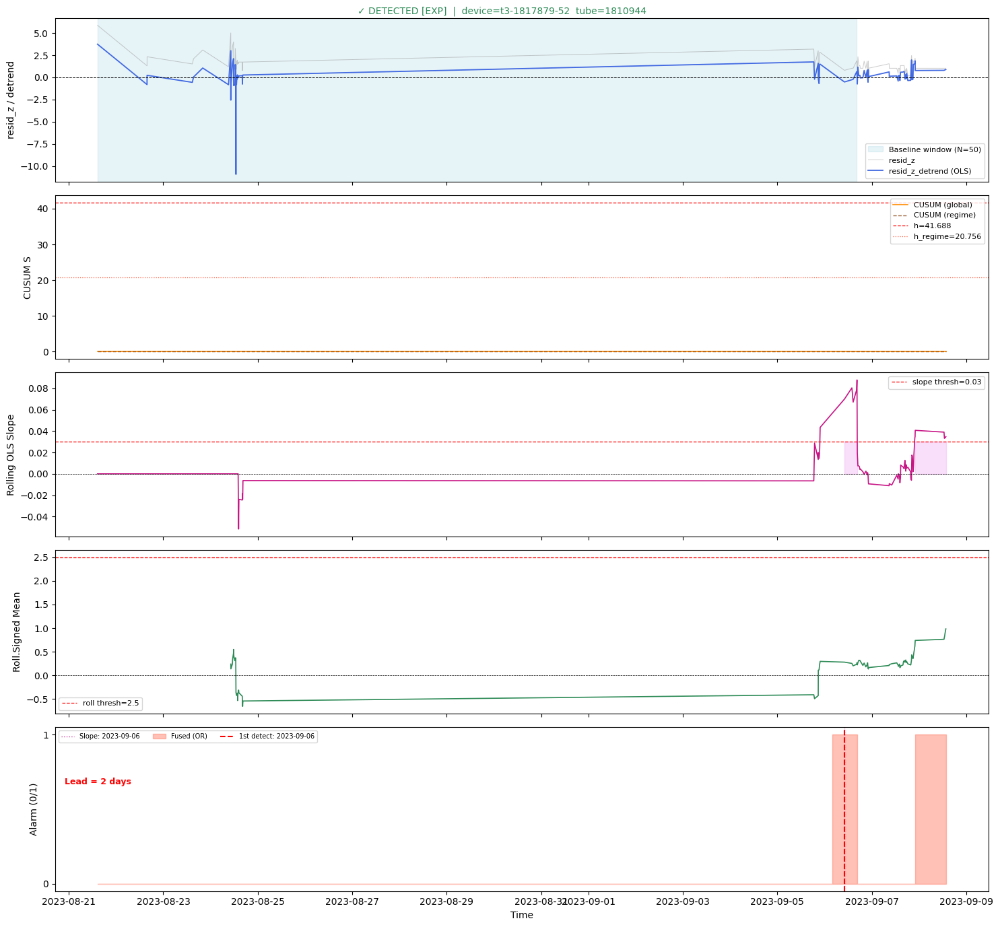

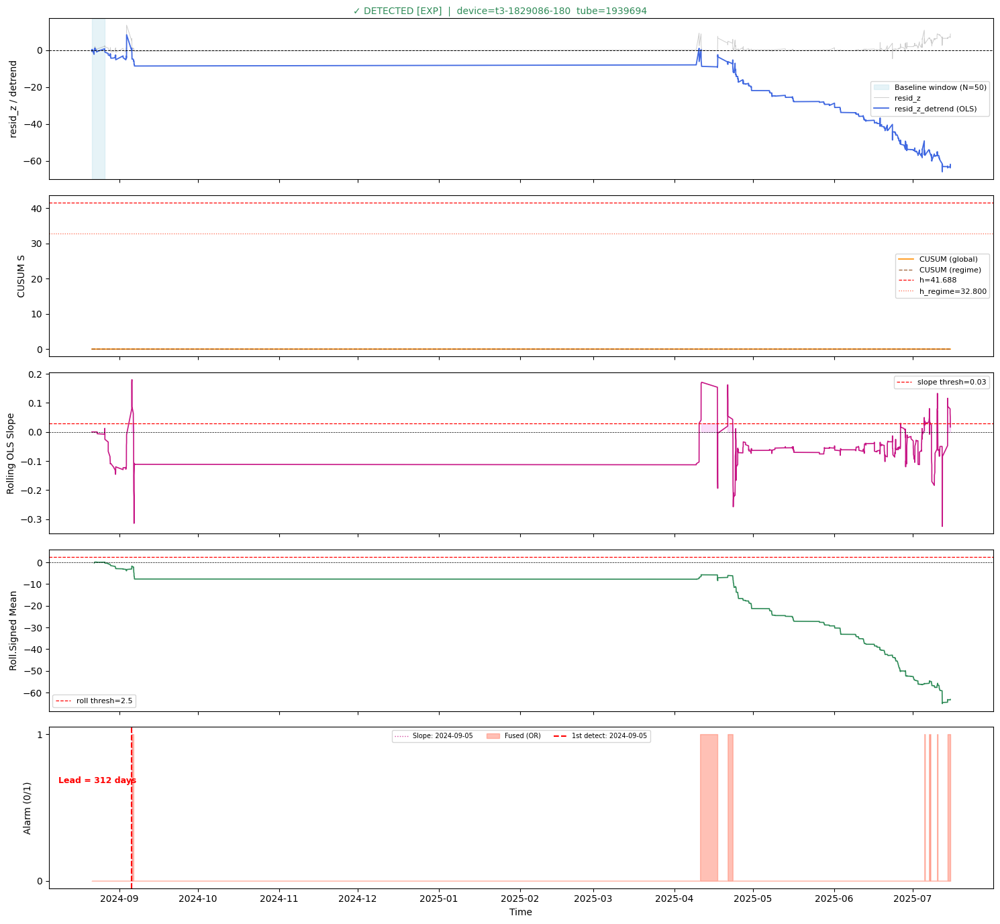

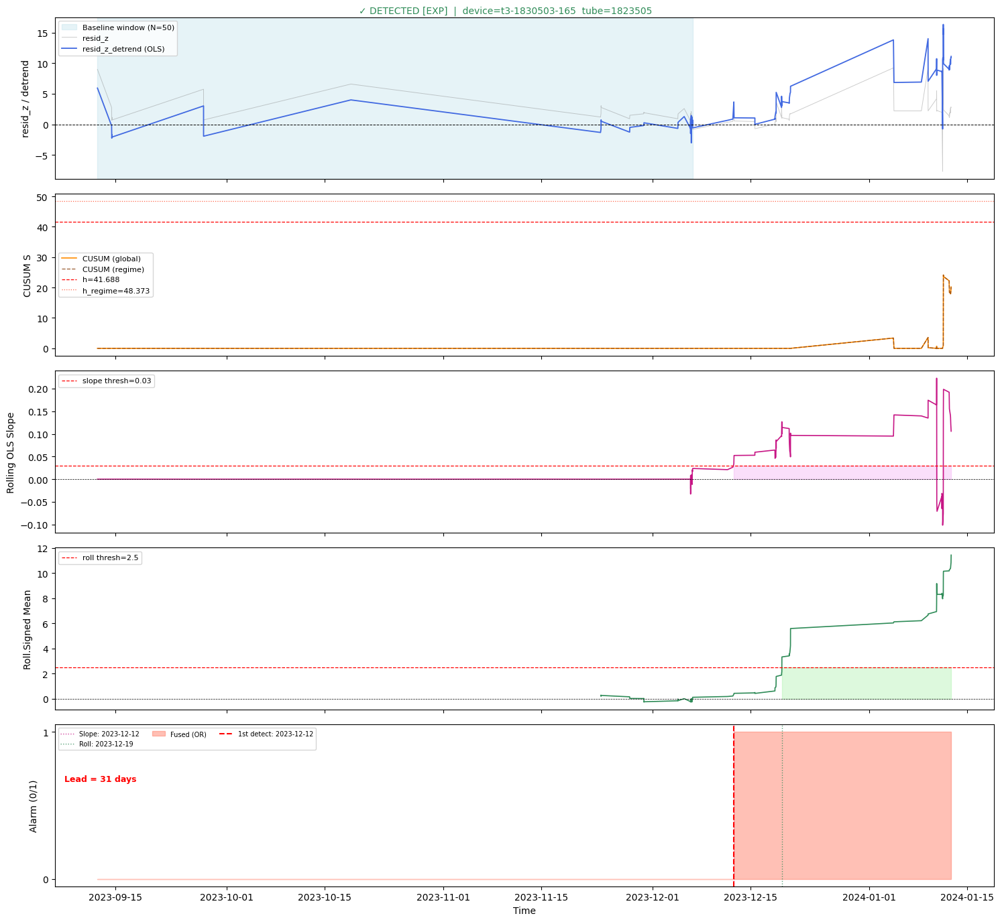

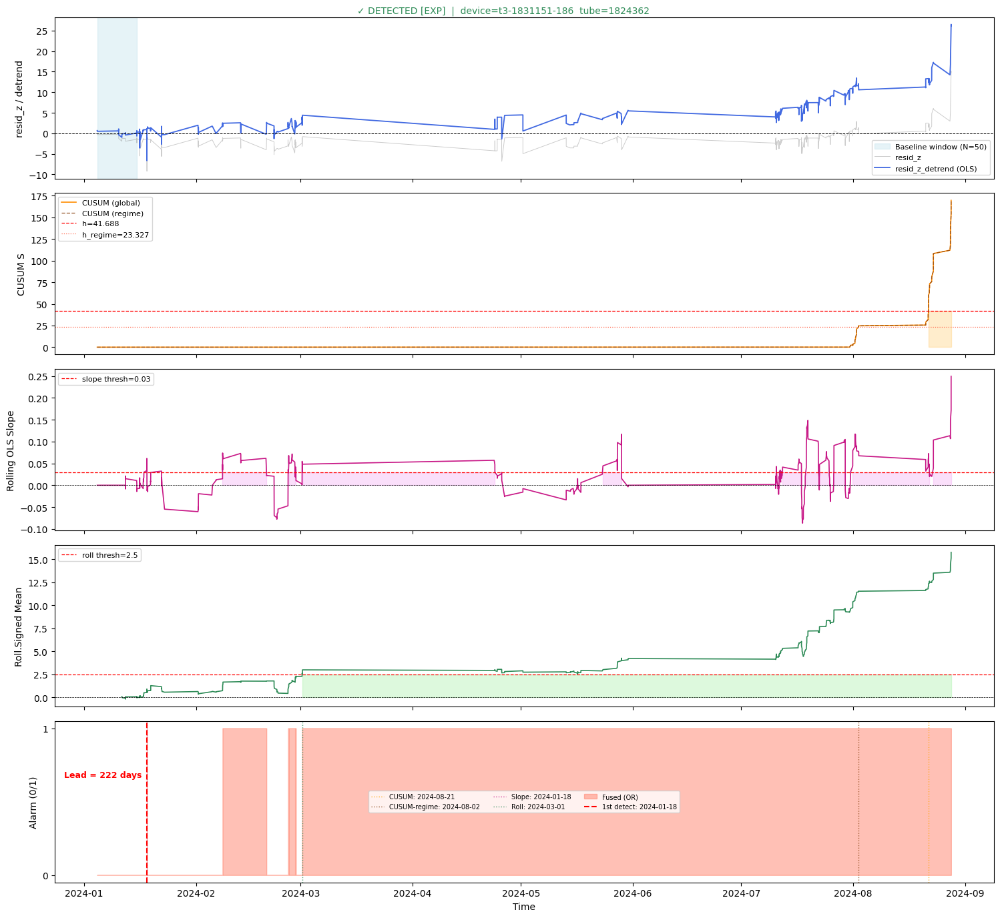

...

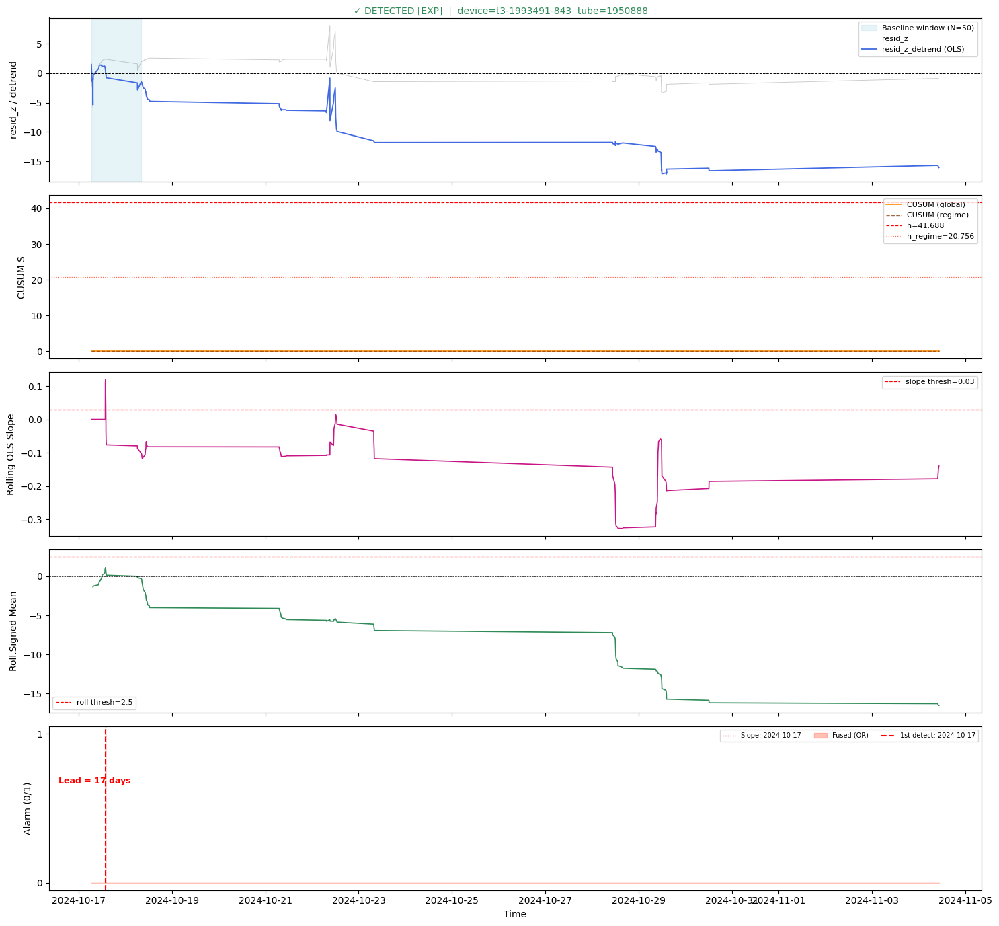

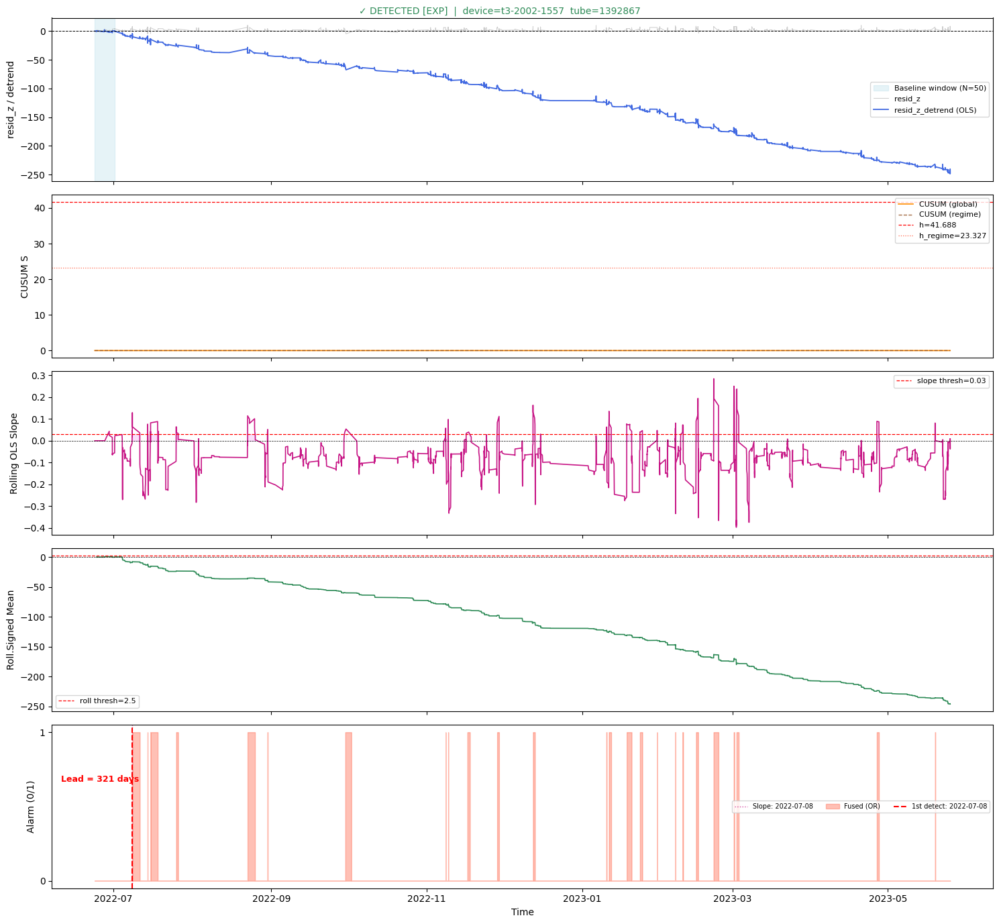

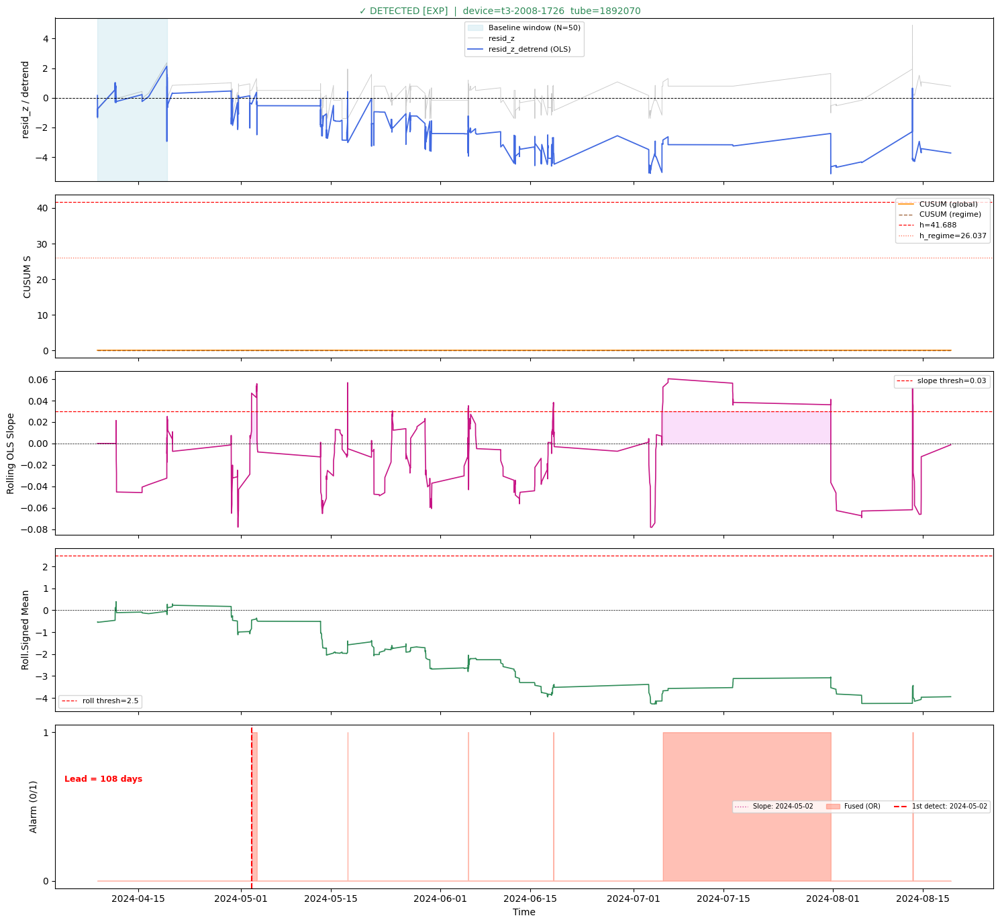

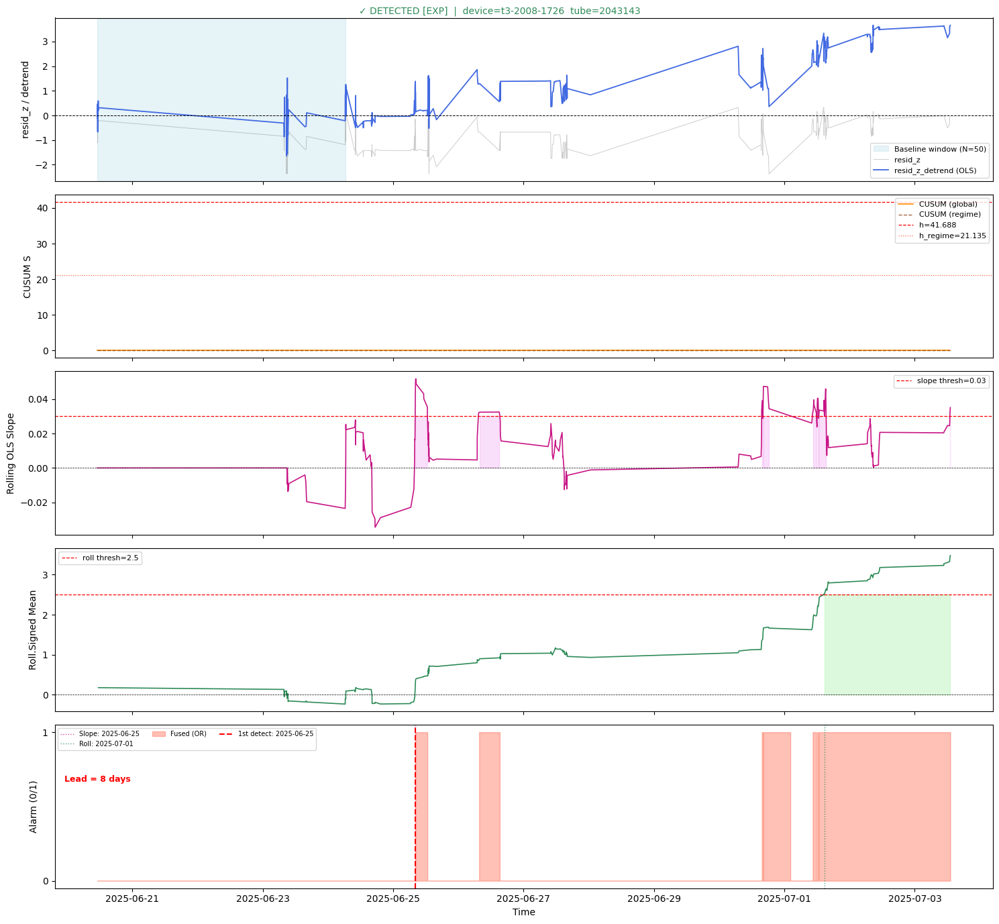

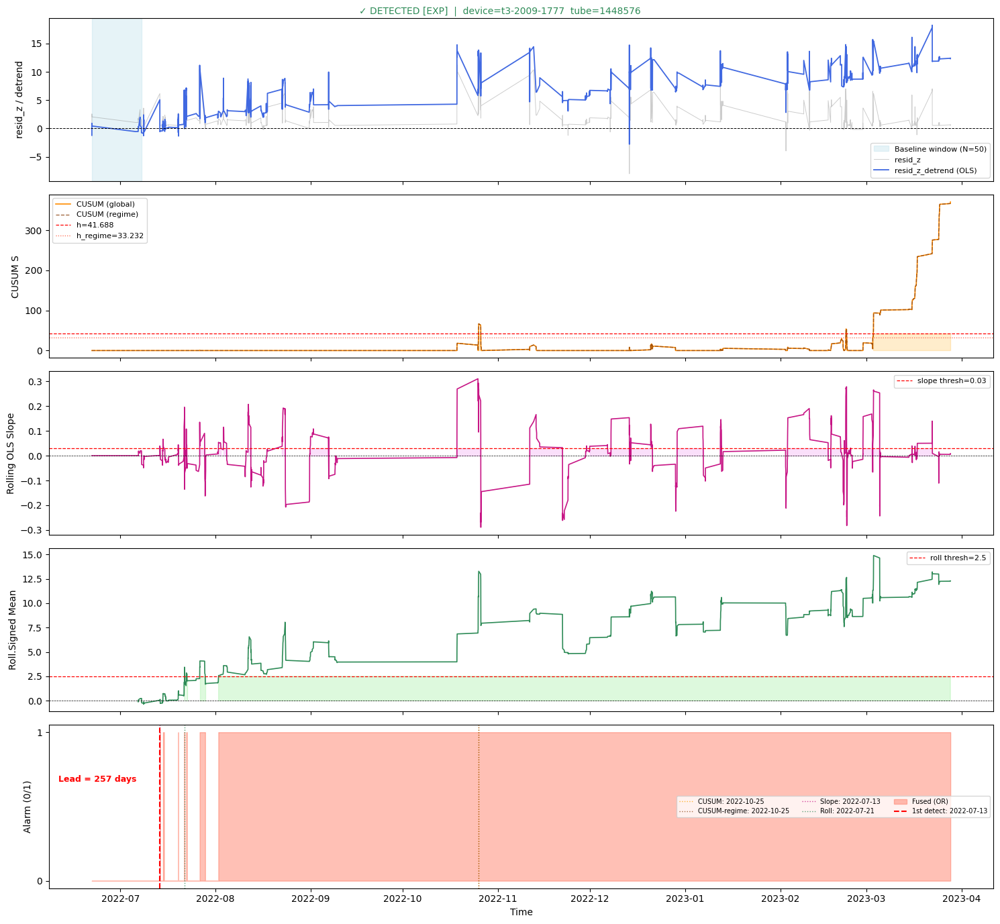

In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] Deep dive per damaged pair — 4 improved signals
# ══════════════════════════════════════════════════════════════════════════════

for (did, tid), grp in te_exp_sig[te_exp_sig["is_damaged"]].groupby(["device_id","tube_id"]):
    grp = grp.sort_values("start_time").reset_index(drop=True)
    t   = pd.to_datetime(grp["start_time"])
    det_row = exp_pair_df[(exp_pair_df["device_id"]==did)&(exp_pair_df["tube_id"]==tid)]
    is_det  = bool(det_row["drift_detected"].values[0]) if len(det_row) else False

    fig, axes = plt.subplots(5, 1, figsize=(15, 14), sharex=True)
    fig.suptitle(
        f"{'✓ DETECTED' if is_det else '✗ MISSED'} [EXP]  |  "
        f"device={did}  tube={tid}", fontsize=10, color="seagreen" if is_det else "tomato"
    )

    # Panel 1: OLS-detrended residual with baseline window marker
    axes[0].axvspan(t.iloc[0], t.iloc[min(EXP_BASELINE_N-1, len(t)-1)],
                    color="lightblue", alpha=0.3, label=f"Baseline window (N={EXP_BASELINE_N})")
    axes[0].plot(t, grp["resid_z"],        color="grey",     lw=0.7, alpha=0.4, label="resid_z")
    axes[0].plot(t, grp["resid_z_detrend"],color="royalblue",lw=1.3, label="resid_z_detrend (OLS)")
    axes[0].axhline(0, color="k", ls="--", lw=0.7)
    axes[0].set_ylabel("resid_z / detrend"); axes[0].legend(fontsize=8)

    # Panel 2: CUSUM (global) + CUSUM (regime)
    axes[1].plot(t, grp["cusum_exp"],       color="darkorange", lw=1.2, label="CUSUM (global)")
    axes[1].plot(t, grp["cusum_regime_exp"],color="saddlebrown",lw=1.0,
                 ls="--", alpha=0.8, label="CUSUM (regime)")
    axes[1].axhline(exp_cusum_h_abs, color="red",    ls="--", lw=0.9, label=f"h={exp_cusum_h_abs:.3f}")
    h_regime_val = get_regime_h(grp["focal_spot"].iloc[0],
                                int(grp["kv_bucket"].iloc[0]) if "kv_bucket" in grp.columns else 0,
                                exp_cusum_h_abs)
    axes[1].axhline(h_regime_val, color="tomato", ls=":", lw=0.9, label=f"h_regime={h_regime_val:.3f}")
    axes[1].fill_between(t, 0, exp_cusum_h_abs,
                         where=grp["cusum_exp_alarm"].values, color="orange", alpha=0.2)
    axes[1].set_ylabel("CUSUM S"); axes[1].legend(fontsize=8)

    # Panel 3: Rolling OLS slope
    axes[2].plot(t, grp["rolling_slope"], color="mediumvioletred", lw=1.2)
    axes[2].axhline(EXP_SLOPE_THRESH, color="red", ls="--", lw=0.9,
                    label=f"slope thresh={EXP_SLOPE_THRESH}")
    axes[2].axhline(0, color="k", ls="--", lw=0.5)
    axes[2].fill_between(t, 0, EXP_SLOPE_THRESH,
                         where=grp["slope_exp_alarm"].values, color="violet", alpha=0.25)
    axes[2].set_ylabel("Rolling OLS Slope"); axes[2].legend(fontsize=8)

    # Panel 4: Rolling signed mean of detrended residual
    axes[3].plot(t, grp["roll_exp_mean"], color="seagreen", lw=1.2)
    axes[3].axhline(ROLLING_SIGNED_ZSCORE_THRESH, color="red", ls="--", lw=0.9,
                    label=f"roll thresh={ROLLING_SIGNED_ZSCORE_THRESH}")
    axes[3].axhline(0, color="k", ls="--", lw=0.5)
    axes[3].fill_between(t, 0, ROLLING_SIGNED_ZSCORE_THRESH,
                         where=grp["roll_exp_alarm"].values, color="lightgreen", alpha=0.3)
    axes[3].set_ylabel("Roll.Signed Mean"); axes[3].legend(fontsize=8)

    # Panel 5: Fused alarm with first-detection marker
    for sig_col, clr, lbl in [
        ("cusum_exp_alarm",        "orange",           "CUSUM"),
        ("cusum_regime_exp_alarm", "saddlebrown",      "CUSUM-regime"),
        ("slope_exp_alarm",        "mediumvioletred",  "Slope"),
        ("roll_exp_alarm",         "seagreen",         "Roll"),
    ]:
        if grp[sig_col].any():
            first_fire = t.iloc[grp[sig_col].values.argmax()]
            axes[4].axvline(first_fire, color=clr, lw=1.0, ls=":", alpha=0.8, label=f"{lbl}: {first_fire.date()}")

    axes[4].fill_between(t, grp[exp_alarm_col].astype(int),
                         step="mid", color="tomato", alpha=0.4, label=f"Fused ({EXP_FUSION_MODE})")
    if is_det:
        first_det_t = pd.to_datetime(det_row["first_detection"].values[0])
        last_t      = pd.to_datetime(det_row["last_filcu_a"].values[0])
        lead        = (last_t - first_det_t).days
        axes[4].axvline(first_det_t, color="red", lw=1.5, ls="--",
                        label=f"1st detect: {first_det_t.date()}")
        axes[4].text(0.01, 0.65, f"Lead = {lead} days",
                     transform=axes[4].transAxes, color="red", fontsize=9, fontweight="bold")
    axes[4].set_yticks([0,1]); axes[4].set_ylabel("Alarm (0/1)")
    axes[4].set_xlabel("Time"); axes[4].legend(fontsize=7, ncol=3)

    plt.tight_layout(); plt.show()


## 16. CUSUM Over Time — All Test Pairs

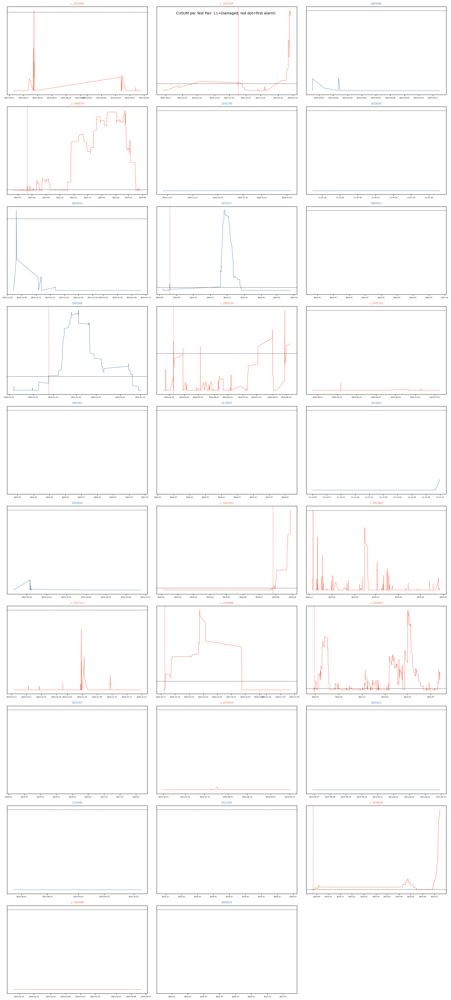

In [0]:
pair_ids = te_sig[["device_id","tube_id","is_damaged"]].drop_duplicates()
ncols = 3; nrows = (len(pair_ids)+ncols-1)//ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4*nrows))
axes = np.array(axes).flatten()

for idx, (_, row) in enumerate(pair_ids.iterrows()):
    grp = te_sig[(te_sig["device_id"]==row["device_id"]) &
                 (te_sig["tube_id"]==row["tube_id"])].sort_values("start_time")
    ax  = axes[idx]
    t   = pd.to_datetime(grp["start_time"])
    col = "tomato" if row["is_damaged"] else "steelblue"
    ax.plot(t, grp["cusum"], lw=0.8, color=col)
    ax.axhline(cusum_h_abs, color="k", ls="--", lw=0.7)
    if grp[alarm_col].any():
        fire_t = t[grp[alarm_col]].iloc[0]
        ax.axvline(fire_t, color="red", lw=1.0, ls=":")
    ax.set_title(f"{'⚠ ' if row['is_damaged'] else ''}{row['tube_id']}", fontsize=7, color=col)
    ax.tick_params(labelsize=5); ax.set_yticks([])

for j in range(idx+1, len(axes)): axes[j].axis("off")
plt.suptitle("CUSUM per Test Pair  (⚠=Damaged, red dot=first alarm)", fontsize=10)
plt.tight_layout(); plt.show()


## 17. Threshold Sweep — Pareto Plot
Sweeps `CUSUM_H` and `ROLLING_SIGNED_ZSCORE_THRESH` simultaneously.
Each point is one parameter combination. Use this to choose the threshold
that gives 100% recall with the fewest false positives.


/root/.ipykernel/1182/command-8839668233379473-690590411:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)
/root/.ipykernel/1182/command-8839668233379473-690590411:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)
/root/.ipykernel/1182/command-8839668233

Top 10 sweep results:


/root/.ipykernel/1182/command-8839668233379473-690590411:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals)


CUSUM_H,RollZ_thresh,recall,FP,TP,FN,mean_lead_days
1.5,1.5,0.769,3,10,3,138.9
1.5,2.0,0.769,3,10,3,138.9
1.5,2.5,0.769,3,10,3,138.9
1.5,3.0,0.769,3,10,3,138.9
1.5,4.0,0.769,3,10,3,138.9
1.5,5.0,0.769,3,10,3,138.9
2.0,1.5,0.769,3,10,3,132.9
2.0,2.0,0.769,3,10,3,132.9
2.0,2.5,0.769,3,10,3,132.9
2.0,3.0,0.769,3,10,3,132.9


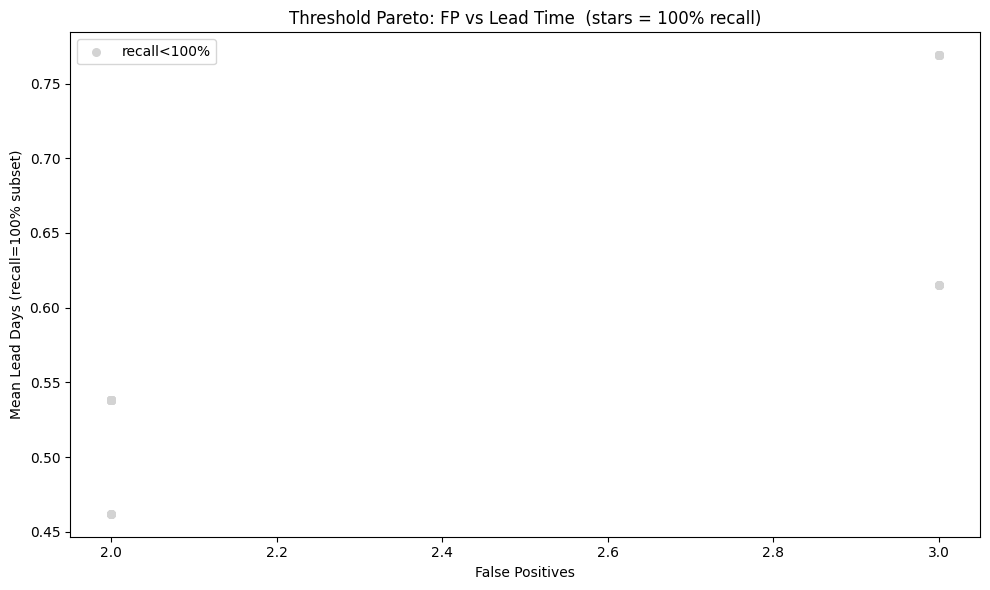

100% recall not achieved. Best recall=77%  CUSUM_H=1.5  RollZ=1.5


In [0]:
sweep_records = []
for h_mult in CUSUM_H_SWEEP:
    for rz in ROLLING_Z_SWEEP:
        h_abs = h_mult * train_resid_std
        k_abs = CUSUM_K * train_resid_std
        sig   = compute_signals(te_res, k_abs, h_abs,
                                roll_window=ROLLING_WINDOW,
                                roll_z_thresh=rz,
                                min_det=MIN_DETECTIONS)
        pf    = pair_level_detection(sig, alarm_col)
        yt    = pf["is_damaged"].astype(int)
        yp    = pf["drift_detected"].astype(int)
        cm_s  = confusion_matrix(yt, yp, labels=[1,0])
        TP_s, FN_s = cm_s[0,0], cm_s[0,1]
        FP_s, TN_s = cm_s[1,0], cm_s[1,1]
        rec_s = TP_s/(TP_s+FN_s) if (TP_s+FN_s)>0 else 0
        det   = pf[pf["is_damaged"] & pf["drift_detected"]]["lead_days"]
        sweep_records.append({
            "CUSUM_H": h_mult, "RollZ_thresh": rz,
            "recall": round(rec_s,3), "FP": FP_s, "TP": TP_s, "FN": FN_s,
            "mean_lead_days": round(det.mean(),1) if len(det)>0 else 0
        })

sweep_df = pd.DataFrame(sweep_records).sort_values(
    ["recall","mean_lead_days","FP"], ascending=[False,False,True])
print("Top 10 sweep results:")
display(spark.createDataFrame(sweep_df.head(10)))

# Pareto scatter
fig, ax = plt.subplots(figsize=(10, 6))
perfect = sweep_df[sweep_df["recall"]==1.0]
rest    = sweep_df[sweep_df["recall"]< 1.0]
if not rest.empty:
    ax.scatter(rest["FP"], rest["recall"], c="lightgrey", s=30, label="recall<100%")
if not perfect.empty:
    sc = ax.scatter(perfect["FP"], perfect["mean_lead_days"],
                    c=perfect["CUSUM_H"], cmap="viridis", s=80,
                    marker="*", zorder=5, label="recall=100%")
    plt.colorbar(sc, ax=ax, label="CUSUM_H multiplier")
ax.set_xlabel("False Positives"); ax.set_ylabel("Mean Lead Days (recall=100% subset)")
ax.set_title("Threshold Pareto: FP vs Lead Time  (stars = 100% recall)")
ax.legend(); plt.tight_layout(); plt.show()

# Best from sweep
best_sweep = sweep_df[sweep_df["recall"]==1.0]
if not best_sweep.empty:
    bs = best_sweep.sort_values(["FP","mean_lead_days"], ascending=[True,False]).iloc[0]
    print(f"\nRecommended: CUSUM_H={bs['CUSUM_H']}  RollZ={bs['RollZ_thresh']}  "
          f"FP={int(bs['FP'])}  Lead={bs['mean_lead_days']}d")
else:
    bs = sweep_df.iloc[0]
    print(f"100% recall not achieved. Best recall={bs['recall']:.0%}  "
          f"CUSUM_H={bs['CUSUM_H']}  RollZ={bs['RollZ_thresh']}")


## 17b. [EXPERIMENTAL] Extended Threshold Sweep
Sweeps `EXP_CUSUM_H` × `EXP_SLOPE_THRESH` for the experimental
signals. Output: Pareto plot + recommended parameter combination.


/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)
/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)
/root/.ipykernel/1182/comman

[EXPERIMENTAL] Top 10 parameter combinations:


/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)


EXP_CUSUM_H,EXP_SLOPE_THRESH,recall,FP,TP,FN,mean_lead_days,median_lead_days
1.0,0.02,1.0,6,13,0,125.4,63.0
1.5,0.02,1.0,6,13,0,125.4,63.0
2.0,0.02,1.0,6,13,0,125.4,63.0
2.5,0.02,1.0,6,13,0,125.4,63.0
3.0,0.02,1.0,6,13,0,125.4,63.0
3.5,0.02,1.0,6,13,0,125.4,63.0
4.0,0.02,1.0,6,13,0,125.4,63.0
5.0,0.02,1.0,6,13,0,125.4,63.0
6.0,0.02,1.0,6,13,0,125.4,63.0
1.0,0.03,1.0,3,13,0,121.3,63.0


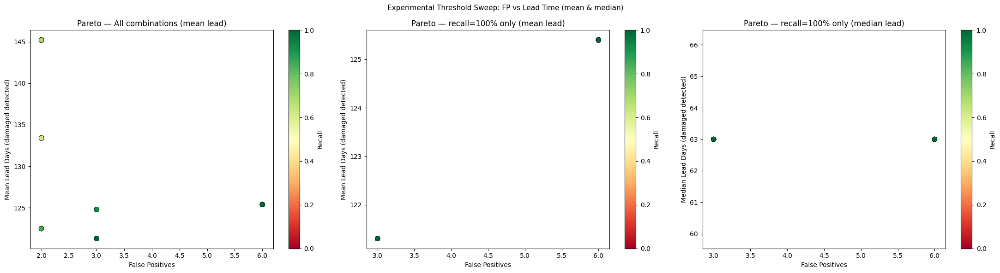


[EXP] Recommended:  EXP_CUSUM_H=1.0  EXP_SLOPE_THRESH=0.03  FP=3  recall=100%  lead=121d  median=63d
→ Copy these values to §2b Configuration and re-run §11b–§15b.


In [0]:
# ══════════════════════════════════════════════════════════════════════════════
# [EXPERIMENTAL] Extended threshold sweep: CUSUM_H × slope_thresh
# ══════════════════════════════════════════════════════════════════════════════

exp_sweep_records = []
for h_mult in EXP_CUSUM_H_SWEEP:
    for sl in EXP_SLOPE_THRESH_SWEEP:
        h_abs = h_mult * exp_train_std
        k_abs = EXP_CUSUM_K * exp_train_std
        sig_s = compute_signals_exp(
            te_exp, k_abs, h_abs,
            slope_thresh=sl,
            roll_z_thresh=ROLLING_SIGNED_ZSCORE_THRESH,
            min_det=EXP_MIN_DETECTIONS
        )
        pf_s = pair_level_detection(sig_s, exp_alarm_col)
        yt_s = pf_s["is_damaged"].astype(int)
        yp_s = pf_s["drift_detected"].astype(int)
        cm_s = confusion_matrix(yt_s, yp_s, labels=[1,0])
        TP_s,FN_s = cm_s[0,0],cm_s[0,1]
        FP_s,TN_s = cm_s[1,0],cm_s[1,1]
        rec_s = TP_s/(TP_s+FN_s) if (TP_s+FN_s)>0 else 0
        det_s = pf_s[pf_s["is_damaged"] & pf_s["drift_detected"]]["lead_days"]
        mean_lead = round(float(det_s.mean()),1) if len(det_s)>0 else 0.0
        median_lead = round(float(det_s.median()),1) if len(det_s)>0 else 0.0
        exp_sweep_records.append({
            "EXP_CUSUM_H": h_mult, "EXP_SLOPE_THRESH": sl,
            "recall": round(rec_s,3), "FP": FP_s, "TP": TP_s, "FN": FN_s,
            "mean_lead_days": mean_lead,
            "median_lead_days": median_lead
        })

exp_sweep_df = pd.DataFrame(exp_sweep_records).sort_values(
    ["recall","mean_lead_days","FP"], ascending=[False,False,True])

print("[EXPERIMENTAL] Top 10 parameter combinations:")
display(spark.createDataFrame(exp_sweep_df.head(10)))

# Pareto scatter: mean lead days
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

perfect_e = exp_sweep_df[exp_sweep_df["recall"]==1.0]
rest_e    = exp_sweep_df[exp_sweep_df["recall"]< 1.0]

for ax, df_plot, title, ycol in [
    (axes[0], exp_sweep_df, "All combinations (mean lead)", "mean_lead_days"),
    (axes[1], perfect_e if not perfect_e.empty else exp_sweep_df[:1], "recall=100% only (mean lead)", "mean_lead_days"),
    (axes[2], perfect_e if not perfect_e.empty else exp_sweep_df[:1], "recall=100% only (median lead)", "median_lead_days"),
]:
    if df_plot.empty: 
        ax.text(0.5,0.5,"No 100% recall found",ha="center"); 
        continue
    sc = ax.scatter(df_plot["FP"], df_plot[ycol],
                    c=df_plot["recall"], cmap="RdYlGn", vmin=0, vmax=1,
                    s=60, edgecolors="k", linewidths=0.4)
    plt.colorbar(sc, ax=ax, label="Recall")
    ax.set_xlabel("False Positives")
    ylabel = "Mean Lead Days (damaged detected)" if ycol=="mean_lead_days" else "Median Lead Days (damaged detected)"
    ax.set_ylabel(ylabel)
    ax.set_title(f"Pareto — {title}")

plt.suptitle("Experimental Threshold Sweep: FP vs Lead Time (mean & median)", fontsize=11)
plt.tight_layout(); plt.show()

# Print recommendation
exp_best = perfect_e if not perfect_e.empty else exp_sweep_df.head(1)
rec_row  = exp_best.sort_values(["FP","mean_lead_days"], ascending=[True,False]).iloc[0]
print(f"\n[EXP] Recommended:  EXP_CUSUM_H={rec_row['EXP_CUSUM_H']}  "
      f"EXP_SLOPE_THRESH={rec_row['EXP_SLOPE_THRESH']}  "
      f"FP={int(rec_row['FP'])}  recall={rec_row['recall']:.0%}  "
      f"lead={rec_row['mean_lead_days']:.0f}d  median={rec_row['median_lead_days']:.0f}d")
print("→ Copy these values to §2b Configuration and re-run §11b–§15b.")

Confusion Matrix with all hyper-parameters on top of the plot

/root/.ipykernel/1182/command-8839668233379475-2383708514:105: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return pdf.groupby(["device_id","tube_id"], group_keys=False).apply(_signals_exp)


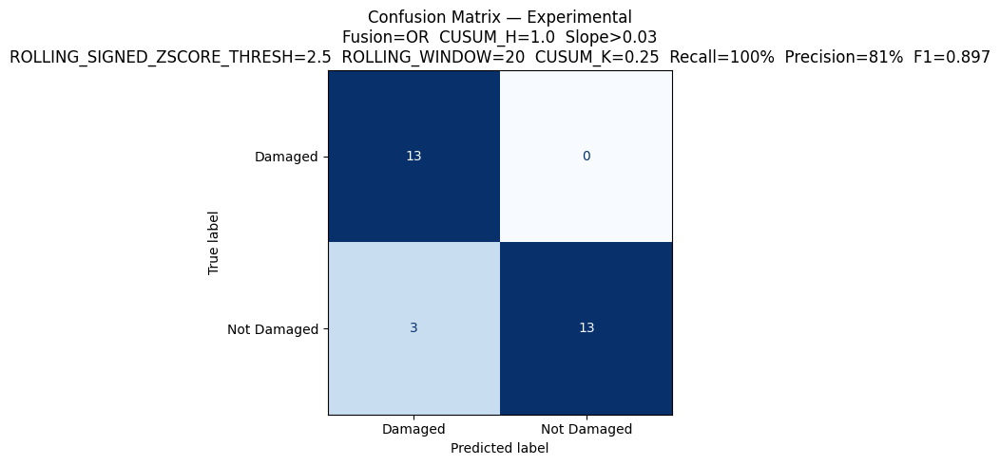

Recall=100.0%  Precision=81.2%  F1=0.897
TP=13  FN=0  FP=3  TN=13


In [0]:

# Compute signals for the requested parameters
h_abs = 1.0 * exp_train_std
k_abs = EXP_CUSUM_K * exp_train_std
sig_exp = compute_signals_exp(
    te_exp, k_abs, h_abs,
    slope_thresh=0.03,
    roll_z_thresh=ROLLING_SIGNED_ZSCORE_THRESH,
    min_det=EXP_MIN_DETECTIONS
)
pf_exp = pair_level_detection(sig_exp, exp_alarm_col)

y_true = pf_exp["is_damaged"].astype(int)
y_pred = pf_exp["drift_detected"].astype(int)
cm = confusion_matrix(y_true, y_pred, labels=[1,0])
TP, FN = cm[0,0], cm[0,1]
FP, TN = cm[1,0], cm[1,1]
rec = TP/(TP+FN) if (TP+FN)>0 else 0
pre = TP/(TP+FP) if (TP+FP)>0 else 0
f1  = 2*pre*rec/(pre+rec) if (pre+rec)>0 else 0

fig, ax = plt.subplots(figsize=(6,5))
ax_title = (
    f"Confusion Matrix — Experimental\n"
    f"Fusion={EXP_FUSION_MODE}  CUSUM_H=1.0  Slope>{0.03}\n"
    f"ROLLING_SIGNED_ZSCORE_THRESH={ROLLING_SIGNED_ZSCORE_THRESH}  "
    f"ROLLING_WINDOW={ROLLING_WINDOW}  "
    f"CUSUM_K={EXP_CUSUM_K}  "
    f"Recall={rec:.0%}  Precision={pre:.0%}  F1={f1:.3f}"
)
ConfusionMatrixDisplay(cm, display_labels=["Damaged","Not Damaged"]).plot(
    ax=ax, colorbar=False, cmap="Blues")
ax.set_title(ax_title)
plt.tight_layout(); plt.show()

print(f"Recall={rec:.1%}  Precision={pre:.1%}  F1={f1:.3f}")
print(f"TP={TP}  FN={FN}  FP={FP}  TN={TN}")



## 18. Signal Contribution Analysis
Which of the three signals is responsible for each detection?

device_id,tube_id,cusum_alarm,roll_alarm,trend_alarm
t3-1678901-1966,1674634,false,false,false
t3-1817879-52,1810944,false,false,false
t3-1829086-180,1939694,true,true,true
t3-1830503-165,1823505,true,false,false
t3-1831151-186,1824362,true,true,false
t3-1882150-500,1864990,false,false,false
t3-1882151-611,1853962,false,false,false
t3-1991730-874,1977123,false,false,false
t3-1993491-843,1950888,true,false,true
t3-2002-1557,1392867,true,true,false


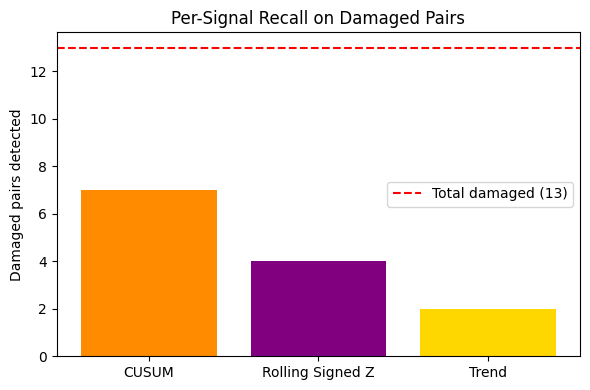

In [0]:
signal_cols = ["cusum_alarm","roll_alarm","trend_alarm"]
sig_summary = []
for (did, tid), g in te_sig[te_sig["is_damaged"]].groupby(["device_id","tube_id"]):
    row = {"device_id":did, "tube_id":tid}
    for sc in signal_cols:
        row[sc] = bool(g[sc].any())
    sig_summary.append(row)
sig_df = pd.DataFrame(sig_summary)
display(spark.createDataFrame(sig_df))

# Bar chart: how many damaged pairs each signal catches
fig, ax = plt.subplots(figsize=(6,4))
counts = [sig_df[sc].sum() for sc in signal_cols]
ax.bar(["CUSUM","Rolling Signed Z","Trend"], counts, color=["darkorange","purple","gold"])
ax.axhline(len(DAMAGED_PAIRS), color="red", ls="--", label=f"Total damaged ({len(DAMAGED_PAIRS)})")
ax.set_ylabel("Damaged pairs detected"); ax.set_title("Per-Signal Recall on Damaged Pairs")
ax.legend(); plt.tight_layout(); plt.show()


## Parameter Tuning Reference

| Parameter | Default | Effect |
|---|---|---|
| `BASELINE_N` | 30 | Early-life samples used to compute each pair's residual baseline. Increase if tubes have a long warm-up phase before settling. |
| `CUSUM_K` | 0.5 | CUSUM allowance in std-dev units. Set to half the expected drift size. Lower = more sensitive to small drifts. |
| `CUSUM_H` | 4.0 | CUSUM alarm threshold in std-dev units. **Lower = more recall, more FP.** Start from sweep results. |
| `ROLLING_SIGNED_ZSCORE_THRESH` | 2.5 | Rolling mean alarm level. Lower = more recall, more FP. |
| `ROLLING_WINDOW` | 20 | Smoothing window for rolling mean. Larger = less noise, slower detection. |
| `KV_BUCKET_SIZE` | 50 | kV bin width for operating-group normalisation. |
| `FUSION_MODE` | `"OR"` | `"OR"` = max recall; `"AND"` = max precision; `"MAJORITY"` = balance. |
| `MIN_DETECTIONS` | 3 | Consecutive alarms needed to confirm. Lower = earlier but noisier. |
| `BALANCE_TRAIN` | `True` | Balance training set. **Test is never balanced.** |

